# PROJECT 2

## Table of contents
<a id='table_of_contents'></a>

0. [Import libraries](#import_libraries)
1. [Import data](#import_data)
2. [Data exploration](#data_exploration)
3. [Data cleaning](#data_cleaning)
4. [Machine Learning Algorithms](#Machine_Learning_Algorithms)
    4.1. [Train-test split](#Train-test_split)
    4.2. [Fit a model to the data](#Fit_a_model_to_the_data)
5. [Feature engineering](#Feature_engineering)
6. [Model training with new features](#Model_training)
    6.1. [Decision Tree](#Decision_tree)
    6.2. [KNN](#KNN)
7. [Conclusion](#Conclusion)


### 0.Import libraries  <a id='import_libraries'></a>



[Back_to_top](#table_of_contents)

In [805]:
import pandas as pd 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import scipy
import sklearn

### 1.Import Data <a id='import_data'></a>
[Back_to_top](#table_of_contents)

In [806]:
hcc_data = pd.read_csv("hcc_dataset.csv")

In [807]:
pd.set_option('display.max_columns',None)

In [808]:
print(hcc_data.shape)
hcc_data.head()

(165, 50)


,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,Diabetes,Obesity,Hemochro,AHT,CRI,HIV,NASH,Varices,Spleno,PHT,PVT,Metastasis,Hallmark,Age,Grams_day,Packs_year,PS,Encephalopathy,Ascites,INR,AFP,Hemoglobin,MCV,Leucocytes,Platelets,Albumin,Total_Bil,ALT,AST,GGT,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class
0,Male,No,Yes,No,No,No,No,Yes,No,Yes,Yes,?,Yes,No,No,No,No,Yes,No,No,No,No,Yes,67,137,15,Active,NaN,NaN,1.53,95,13.7,106.6,4.9,99,3.4,2.1,34,41,183,150,7.1,0.7,1,3.5,0.5,?,?,?,Lives
1,Female,?,No,No,No,No,Yes,Yes,?,?,Yes,No,No,Yes,No,No,No,Yes,No,No,No,No,Yes,62,0,?,Active,NaN,NaN,?,?,?,?,?,?,?,?,?,?,?,?,?,?,1,1.8,?,?,?,?,Lives
2,Male,No,Yes,Yes,No,Yes,No,Yes,No,Yes,No,No,No,Yes,Yes,No,No,No,No,Yes,No,Yes,Yes,78,50,50,Ambulatory,NaN,Mild,0.96,5.8,8.9,79.8,8.4,472,3.3,0.4,58,68,202,109,7,2.1,5,13,0.1,28,6,16,Lives
3,Male,Yes,Yes,No,No,No,No,Yes,No,Yes,Yes,No,No,Yes,No,No,No,No,No,No,No,Yes,Yes,77,40,30,Active,NaN,NaN,0.95,2440,13.4,97.1,9,279,3.7,0.4,16,64,94,174,8.1,1.11,2,15.7,0.2,?,?,?,Dies
4,Male,Yes,Yes,Yes,No,Yes,No,Yes,No,Yes,No,No,No,Yes,Yes,No,No,No,No,No,No,No,Yes,76,100,30,Active,NaN,NaN,0.94,49,14.3,95.1,6.4,199,4.1,0.7,147,306,173,109,6.9,1.8,1,9,?,59,15,22,Lives


### 2.Data exploration  <a id='data_exploration'></a>

[Back_to_top](#table_of_contents)

In [809]:
hcc_data.columns

Index(['Gender', 'Symptoms', 'Alcohol', 'HBsAg', 'HBeAg', 'HBcAb', 'HCVAb',
       'Cirrhosis', 'Endemic', 'Smoking', 'Diabetes', 'Obesity', 'Hemochro',
       'AHT', 'CRI', 'HIV', 'NASH', 'Varices', 'Spleno', 'PHT', 'PVT',
       'Metastasis', 'Hallmark', 'Age', 'Grams_day', 'Packs_year', 'PS',
       'Encephalopathy', 'Ascites', 'INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', ' Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodules', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin', 'Class'],
      dtype='object')

In [810]:
hcc_data.dtypes

Gender            object
Symptoms          object
Alcohol           object
HBsAg             object
HBeAg             object
HBcAb             object
HCVAb             object
Cirrhosis         object
Endemic           object
Smoking           object
Diabetes          object
Obesity           object
Hemochro          object
AHT               object
CRI               object
HIV               object
NASH              object
Varices           object
Spleno            object
PHT               object
PVT               object
Metastasis        object
Hallmark          object
Age                int64
Grams_day         object
Packs_year        object
PS                object
Encephalopathy    object
Ascites           object
INR               object
AFP               object
Hemoglobin        object
MCV               object
Leucocytes        object
Platelets         object
 Albumin          object
Total_Bil         object
ALT               object
AST               object
GGT               object


In [811]:
numerical_columns = ['Age','Grams_day', 'Packs_year','INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', ' Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodules', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin']
for col in numerical_columns:
    # Verificar se a coluna é de tipo object, indicando possível presença de strings
    if hcc_data[col].dtype == 'object' :
        hcc_data[col]=pd.to_numeric(hcc_data[col].str.replace(' ', ''), errors='coerce')
    else:
        # Se não for object, converte diretamente
        hcc_data[col]=pd.to_numeric(hcc_data[col], errors='coerce')

In [812]:
hcc_data.dtypes

Gender             object
Symptoms           object
Alcohol            object
HBsAg              object
HBeAg              object
HBcAb              object
HCVAb              object
Cirrhosis          object
Endemic            object
Smoking            object
Diabetes           object
Obesity            object
Hemochro           object
AHT                object
CRI                object
HIV                object
NASH               object
Varices            object
Spleno             object
PHT                object
PVT                object
Metastasis         object
Hallmark           object
Age                 int64
Grams_day         float64
Packs_year        float64
PS                 object
Encephalopathy     object
Ascites            object
INR               float64
AFP               float64
Hemoglobin        float64
MCV               float64
Leucocytes        float64
Platelets         float64
 Albumin          float64
Total_Bil         float64
ALT               float64
AST         

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Grams_day'}>,
        <Axes: title={'center': 'Packs_year'}>,
        <Axes: title={'center': 'INR'}>, <Axes: title={'center': 'AFP'}>],
       [<Axes: title={'center': 'Hemoglobin'}>,
        <Axes: title={'center': 'MCV'}>,
        <Axes: title={'center': 'Leucocytes'}>,
        <Axes: title={'center': 'Platelets'}>,
        <Axes: title={'center': ' Albumin'}>],
       [<Axes: title={'center': 'Total_Bil'}>,
        <Axes: title={'center': 'ALT'}>, <Axes: title={'center': 'AST'}>,
        <Axes: title={'center': 'GGT'}>, <Axes: title={'center': 'ALP'}>],
       [<Axes: title={'center': 'TP'}>,
        <Axes: title={'center': 'Creatinine'}>,
        <Axes: title={'center': 'Nodules'}>,
        <Axes: title={'center': 'Major_Dim'}>,
        <Axes: title={'center': 'Dir_Bil'}>],
       [<Axes: title={'center': 'Iron'}>,
        <Axes: title={'center': 'Sat'}>,
        <Axes: title={'center': 'Ferritin'}>, <Axes: 

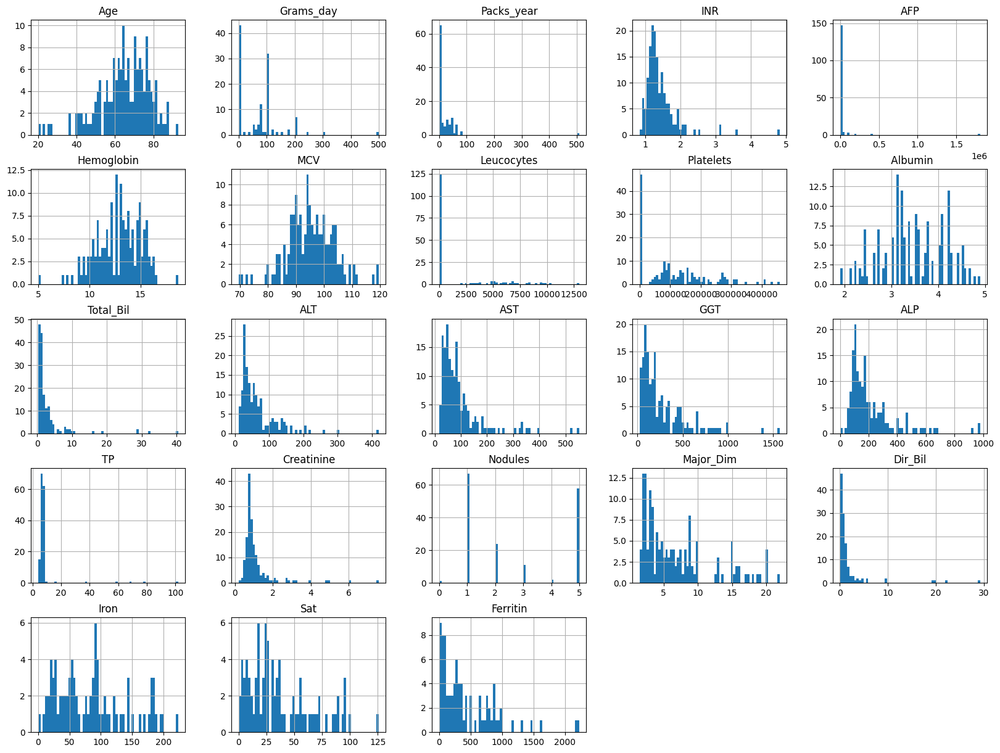

In [813]:
hcc_data.hist(figsize=(20,15),bins=60)

<Axes: xlabel='index', ylabel='Grams_day'>

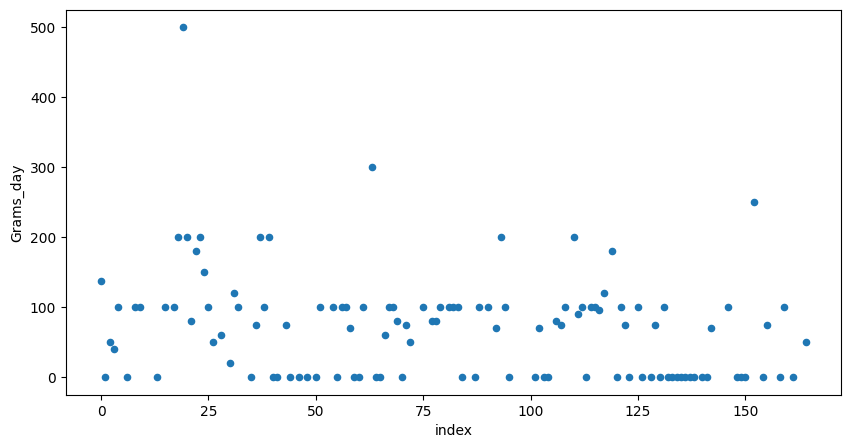

In [814]:
hcc_data.reset_index().plot(kind='scatter',y='Grams_day',x='index',figsize=(10,5))

<Axes: xlabel='Grams_day'>

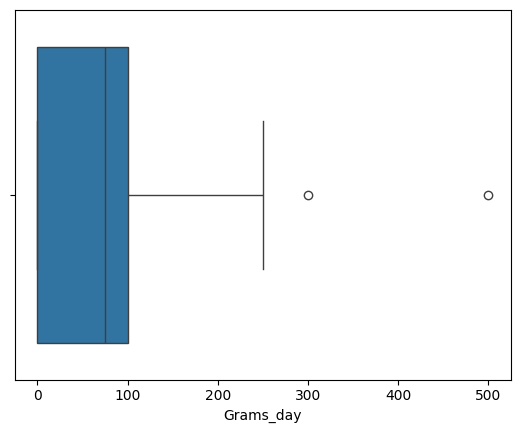

In [815]:
sns.boxplot(x=hcc_data['Grams_day'])

<Axes: xlabel='index', ylabel='Packs_year'>

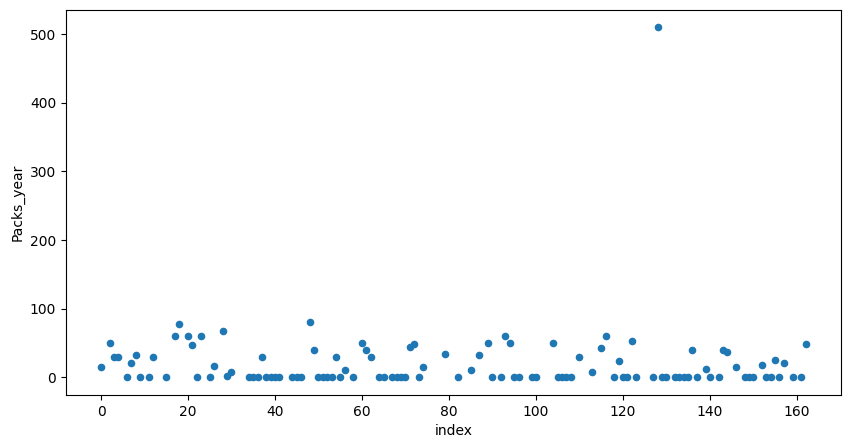

In [816]:
hcc_data.reset_index().plot(kind='scatter',y='Packs_year',x='index',figsize=(10,5))

In [817]:
hcc_data[hcc_data['Packs_year']>100].shape

(1, 50)

<Axes: xlabel='index', ylabel='INR'>

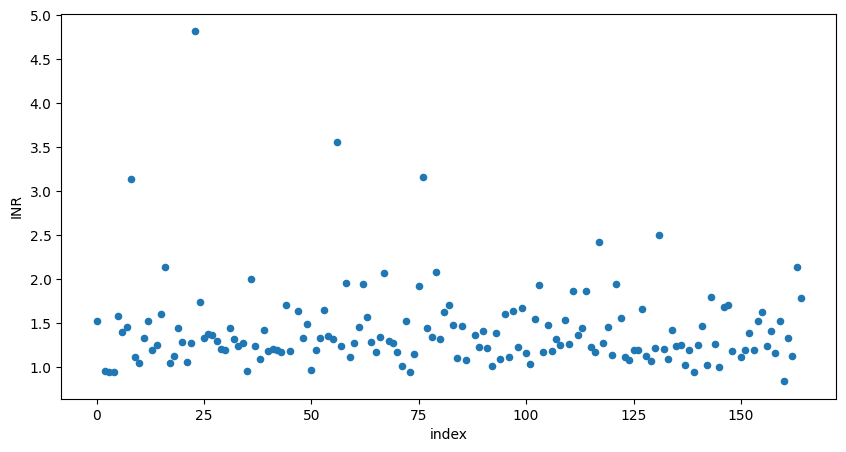

In [818]:
hcc_data.reset_index().plot(kind='scatter',y='INR',x='index',figsize=(10,5))

In [819]:
hcc_data[hcc_data['Packs_year']>2.5].shape

(49, 50)

<Axes: xlabel='index', ylabel='AFP'>

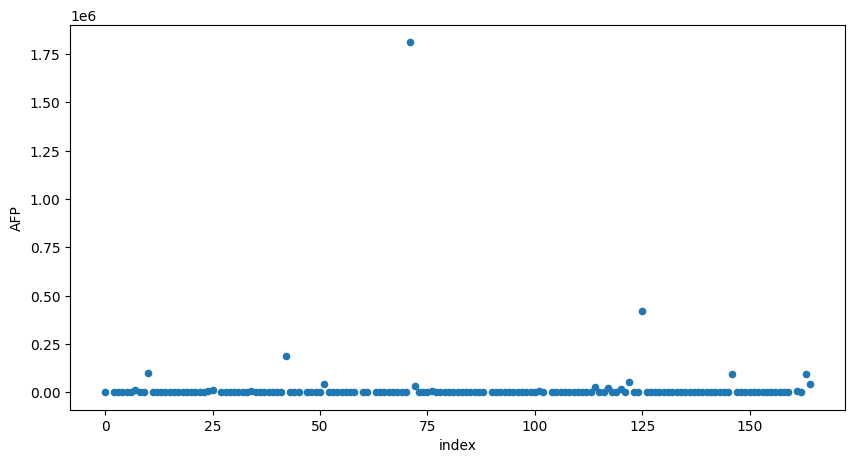

In [820]:
hcc_data.reset_index().plot(kind='scatter',y='AFP',x='index',figsize=(10,5))

In [821]:
hcc_data[hcc_data['Packs_year']>500].shape

(1, 50)

<Axes: xlabel='index', ylabel='Hemoglobin'>

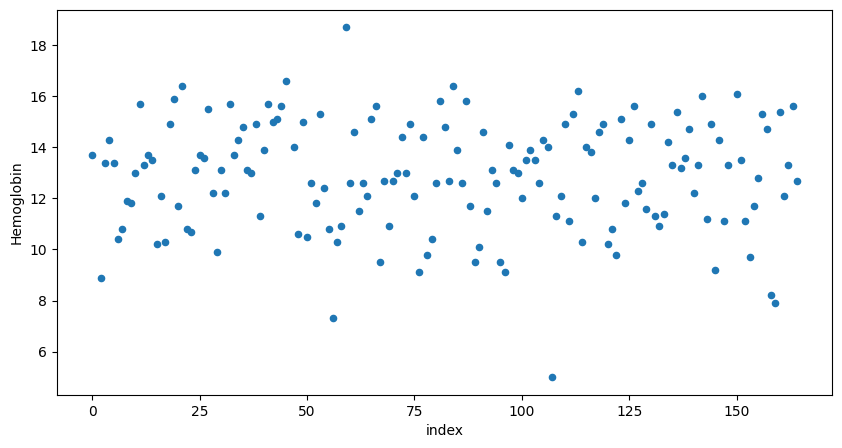

In [822]:
hcc_data.reset_index().plot(kind='scatter',y='Hemoglobin',x='index',figsize=(10,5))

In [823]:
hcc_data['Hemoglobin'].mean()

12.87901234567901

In [824]:
hcc_data[hcc_data['Hemoglobin']<10].shape

(15, 50)

In [825]:
hcc_data[hcc_data['Hemoglobin']>17.2].shape

(1, 50)

<Axes: xlabel='index', ylabel='MCV'>

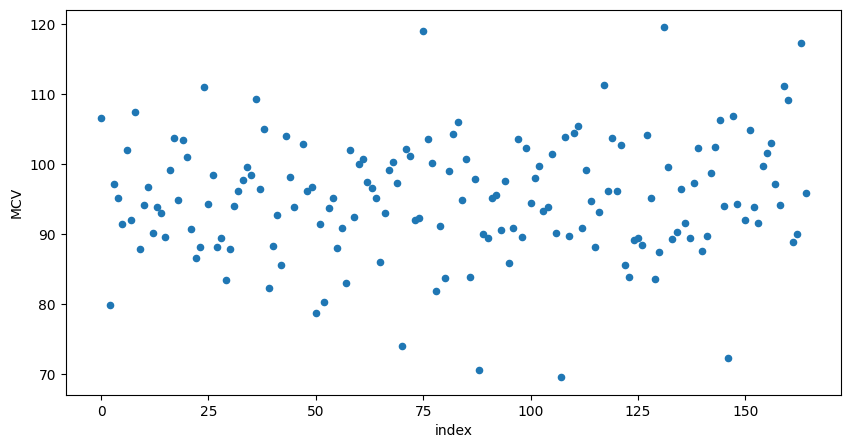

In [826]:
hcc_data.reset_index().plot(kind='scatter',y='MCV',x='index',figsize=(10,5))

In [827]:
hcc_data[hcc_data['MCV']>111].shape

(5, 50)

In [828]:
hcc_data[hcc_data['MCV']<71].shape

(2, 50)

<Axes: xlabel='index', ylabel='Leucocytes'>

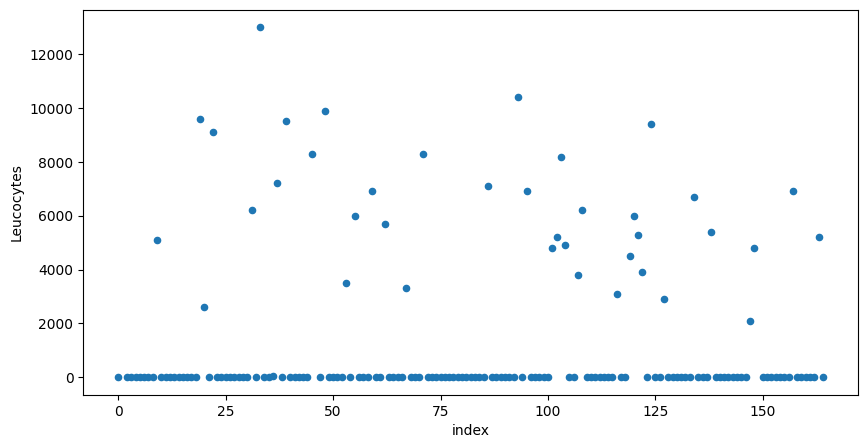

In [829]:
hcc_data.reset_index().plot(kind='scatter',y='Leucocytes',x='index',figsize=(10,5))

In [830]:
hcc_data[hcc_data['Leucocytes']>11000].shape

(1, 50)

In [831]:
hcc_data['Leucocytes'].describe()

count      162.000000
mean      1473.961549
std       2909.106006
min          2.200000
25%          5.100000
50%          7.200000
75%         19.525000
max      13000.000000
Name: Leucocytes, dtype: float64

In [832]:
hcc_data[hcc_data['Leucocytes']<200].shape

(124, 50)

<Axes: xlabel='index', ylabel='Platelets'>

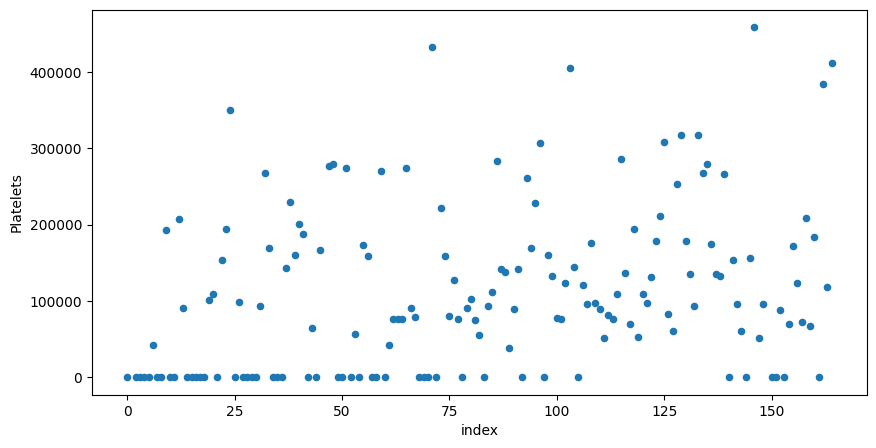

In [833]:
hcc_data.reset_index().plot(kind='scatter',y='Platelets',x='index',figsize=(10,5))

In [834]:
hcc_data['Platelets'].describe()

count       162.000000
mean     113206.442654
std      107118.632481
min           1.710000
25%         255.750000
50%       93000.000000
75%      171500.000000
max      459000.000000
Name: Platelets, dtype: float64

In [835]:
hcc_data[hcc_data['Platelets']<50000].shape

(50, 50)

<Axes: xlabel='index', ylabel=' Albumin'>

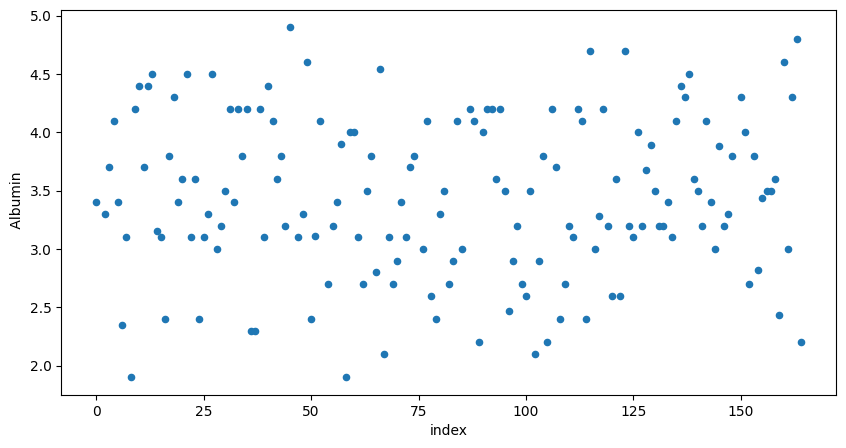

In [836]:
hcc_data.reset_index().plot(kind='scatter',y=' Albumin',x='index',figsize=(10,5))

In [837]:
hcc_data[hcc_data[' Albumin']<2.0].shape

(2, 50)

<Axes: xlabel='index', ylabel='Total_Bil'>

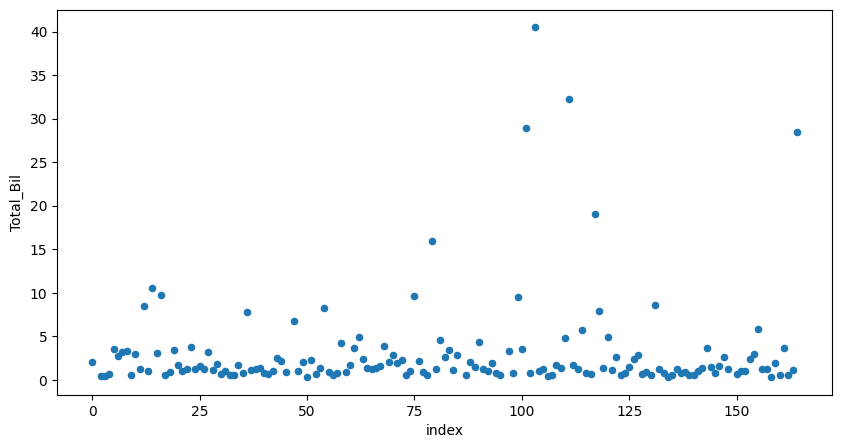

In [838]:
hcc_data.reset_index().plot(kind='scatter',y='Total_Bil',x='index',figsize=(10,5))

In [839]:
hcc_data[hcc_data['Total_Bil']>20].shape

(4, 50)

<Axes: xlabel='index', ylabel='ALT'>

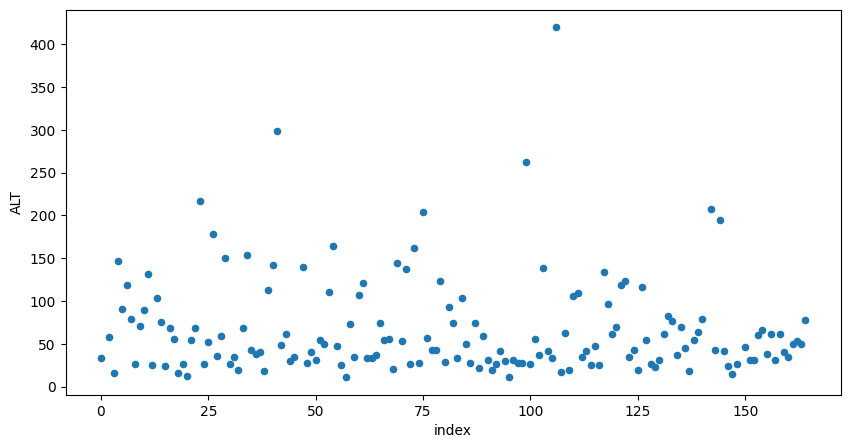

In [840]:
hcc_data.reset_index().plot(kind='scatter',y='ALT',x='index',figsize=(10,5))

In [841]:
hcc_data['ALT'].describe()

count    161.000000
mean      67.093168
std       57.539747
min       11.000000
25%       31.000000
50%       50.000000
75%       78.000000
max      420.000000
Name: ALT, dtype: float64

In [842]:
hcc_data[hcc_data['ALT']>300].shape

(1, 50)

<Axes: xlabel='index', ylabel='AST'>

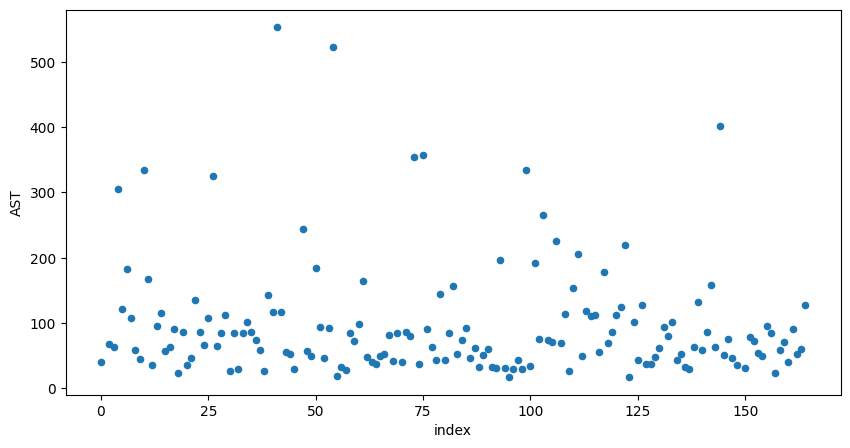

In [843]:
hcc_data.reset_index().plot(kind='scatter',y='AST',x='index',figsize=(10,5))

In [844]:
hcc_data['AST'].describe()

count    162.000000
mean      96.382716
std       87.484241
min       17.000000
25%       46.250000
50%       71.000000
75%      110.250000
max      553.000000
Name: AST, dtype: float64

In [845]:
hcc_data[hcc_data['AST']>400].shape

(3, 50)

In [846]:
hcc_data[hcc_data['AST']<25].shape

(5, 50)

<Axes: xlabel='index', ylabel='GGT'>

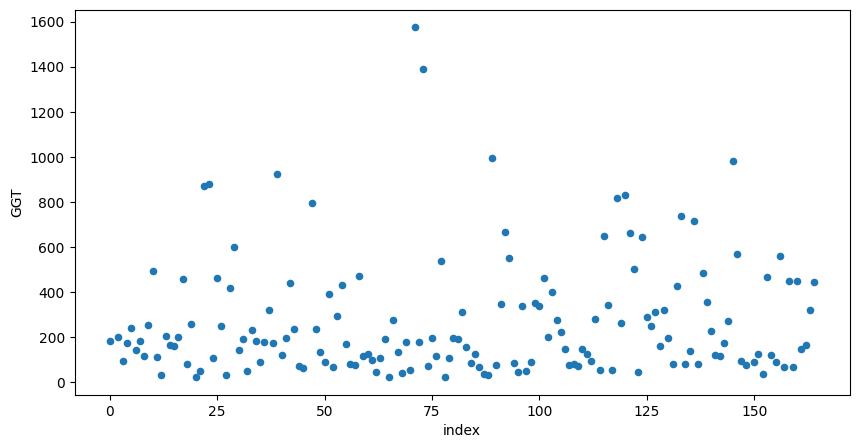

In [847]:
hcc_data.reset_index().plot(kind='scatter',y='GGT',x='index',figsize=(10,5))

In [848]:
hcc_data['GGT'].describe()

count     162.000000
mean      268.026543
std       258.750319
min        23.000000
25%        91.250000
50%       179.500000
75%       345.250000
max      1575.000000
Name: GGT, dtype: float64

In [849]:
hcc_data[hcc_data['GGT']>=1000].shape

(2, 50)

<Axes: xlabel='index', ylabel='ALP'>

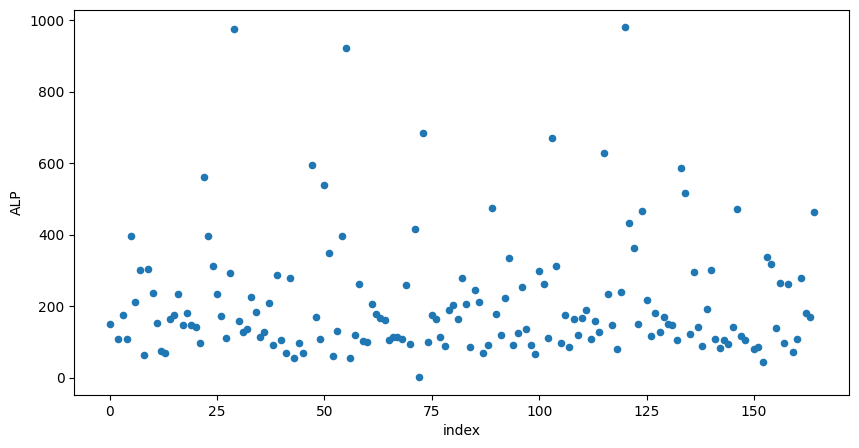

In [850]:
hcc_data.reset_index().plot(kind='scatter',y='ALP',x='index',figsize=(10,5))

In [851]:
hcc_data['ALP'].describe()

count    162.000000
mean     212.211605
std      167.943548
min        1.280000
25%      108.250000
50%      162.000000
75%      261.500000
max      980.000000
Name: ALP, dtype: float64

In [852]:
hcc_data[hcc_data['ALP']<30].shape

(1, 50)

In [853]:
hcc_data[hcc_data['ALP']>800].shape

(3, 50)

<Axes: xlabel='index', ylabel='Creatinine'>

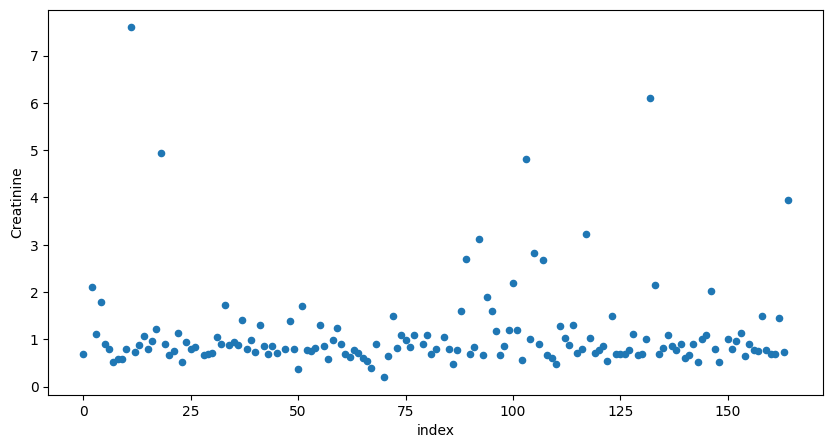

In [854]:
hcc_data.reset_index().plot(kind='scatter',y='Creatinine',x='index',figsize=(10,5))

In [855]:
hcc_data['Creatinine'].describe()

count    158.000000
mean       1.127089
std        0.955856
min        0.200000
25%        0.700000
50%        0.850000
75%        1.100000
max        7.600000
Name: Creatinine, dtype: float64

In [856]:
hcc_data[hcc_data['Creatinine']>4].shape

(4, 50)

<Axes: xlabel='index', ylabel='TP'>

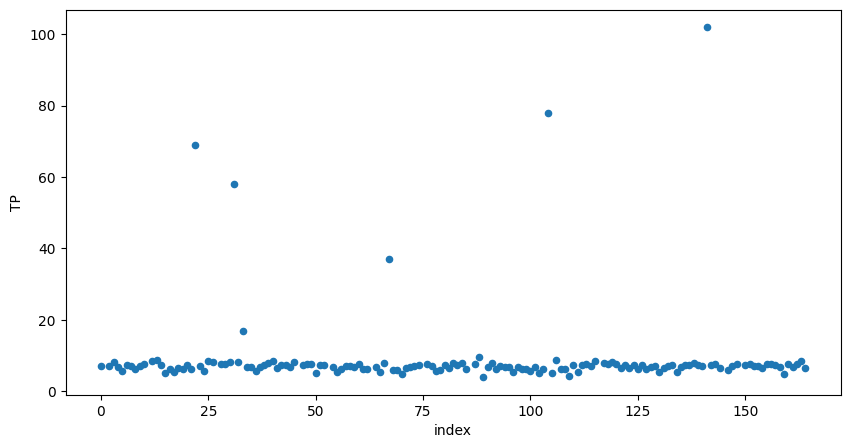

In [857]:
hcc_data.reset_index().plot(kind='scatter',y='TP',x='index',figsize=(10,5))

In [858]:
hcc_data['TP'].describe()

count    154.000000
mean       8.961039
std       11.728739
min        3.900000
25%        6.300000
50%        7.050000
75%        7.575000
max      102.000000
Name: TP, dtype: float64

In [859]:
hcc_data[hcc_data['TP']>11].shape

(6, 50)

<Axes: xlabel='index', ylabel='Major_Dim'>

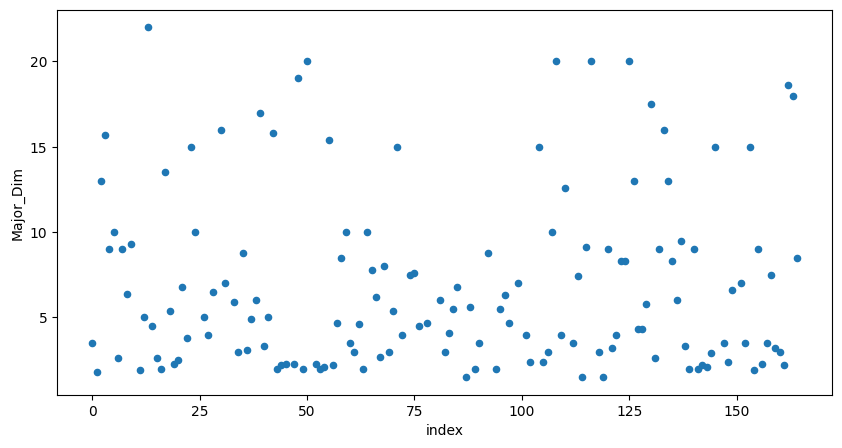

In [860]:
hcc_data.reset_index().plot(kind='scatter',y='Major_Dim',x='index',figsize=(10,5))

In [861]:
hcc_data[hcc_data['Major_Dim']>20].shape

(1, 50)

<Axes: xlabel='index', ylabel='Dir_Bil'>

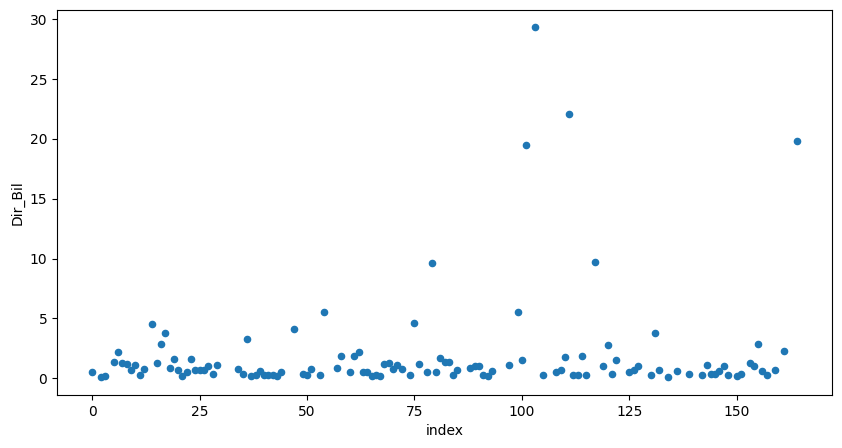

In [862]:
hcc_data.reset_index().plot(kind='scatter',y='Dir_Bil',x='index',figsize=(10,5))

In [863]:
hcc_data[hcc_data['Dir_Bil']>7].shape

(6, 50)

<Axes: xlabel='index', ylabel='Iron'>

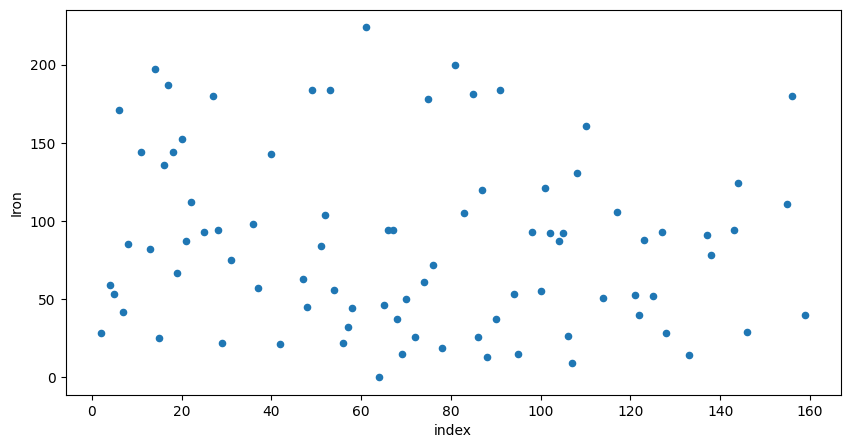

In [864]:
hcc_data.reset_index().plot(kind='scatter',y='Iron',x='index',figsize=(10,5))

In [865]:
hcc_data[hcc_data['Iron']<10].shape

(2, 50)

In [866]:
hcc_data[hcc_data['Iron']>200].shape

(1, 50)

<Axes: xlabel='index', ylabel='Sat'>

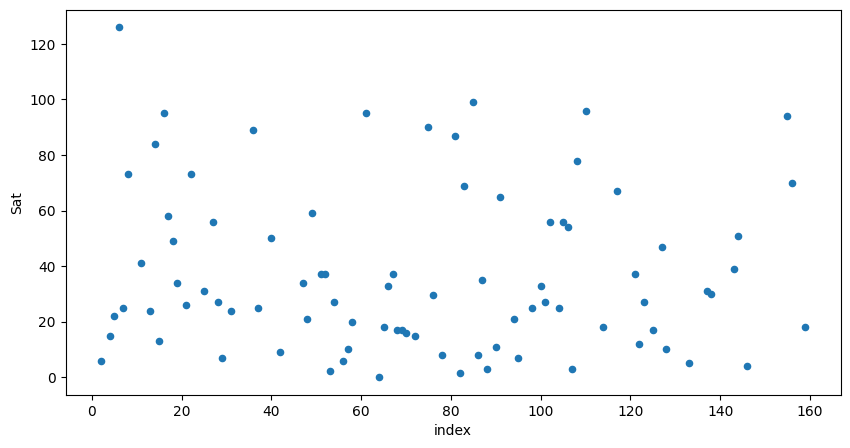

In [867]:
hcc_data.reset_index().plot(kind='scatter',y='Sat',x='index',figsize=(10,5))

In [868]:
hcc_data[hcc_data['Sat']>90].shape

(6, 50)

<Axes: xlabel='index', ylabel='Ferritin'>

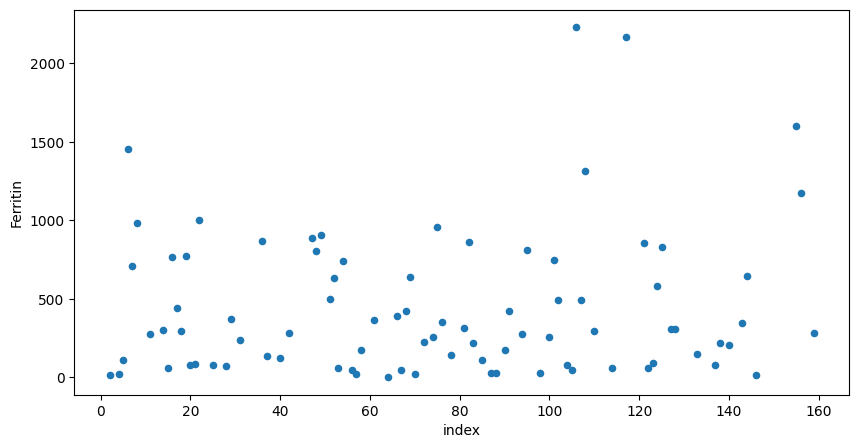

In [869]:
hcc_data.reset_index().plot(kind='scatter',y='Ferritin',x='index',figsize=(10,5))

In [870]:
hcc_data['Ferritin'].describe()

count      85.000000
mean      438.997647
std       457.114454
min         0.000000
25%        84.000000
50%       295.000000
75%       706.000000
max      2230.000000
Name: Ferritin, dtype: float64

In [871]:
hcc_data[hcc_data['Ferritin']>1000].shape

(7, 50)

### 3.Data cleaning  <a id='data_cleaning'></a>

[Back_to_top](#table_of_contents)

In [872]:
median_value = hcc_data[hcc_data['Grams_day'] <300]['Grams_day'].median()
hcc_data.loc[hcc_data['Grams_day'] >= 300, 'Grams_day'] = median_value

In [873]:
median_value = hcc_data[hcc_data['Packs_year'] < 100]['Packs_year'].median()
hcc_data.loc[hcc_data['Packs_year'] >= 100, 'Packs_year'] = median_value

In [874]:
median_value = hcc_data[hcc_data['INR'] < 2.5]['INR'].median()
hcc_data.loc[hcc_data['INR'] >= 2.5, 'INR'] = median_value

In [875]:
median_value = hcc_data[hcc_data['AFP'] < 125000]['AFP'].median()
hcc_data.loc[hcc_data['AFP'] >= 125000, 'AFP'] = median_value

<Axes: >

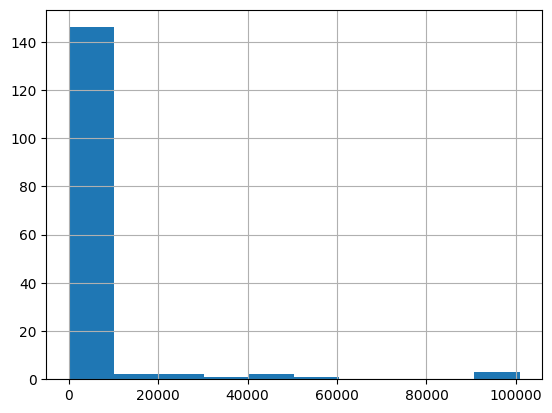

In [876]:
hcc_data['AFP'].hist()

In [877]:
median_value = hcc_data[hcc_data['Hemoglobin'] > 6]['Hemoglobin'].median()
hcc_data.loc[hcc_data['Hemoglobin'] <= 6, 'Hemoglobin'] = median_value

In [878]:
median_value = hcc_data[(hcc_data['MCV'] > 71) & (hcc_data['MCV'] < 111)]['MCV'].median()
hcc_data.loc[(hcc_data['MCV'] <= 71 )|(hcc_data['MCV'] >=111 ), 'MCV'] = median_value

In [879]:
median_value = hcc_data[hcc_data['Total_Bil'] < 20]['Total_Bil'].median()
hcc_data.loc[hcc_data['Total_Bil'] >= 20, 'Total_Bil'] = median_value

In [880]:
median_value = hcc_data[hcc_data['AST'] < 500]['AST'].median()
hcc_data.loc[hcc_data['AST'] >= 500, 'AST'] = median_value

In [881]:
median_value = hcc_data[hcc_data['GGT'] < 1000]['GGT'].median()
hcc_data.loc[hcc_data['GGT'] >= 1000, 'GGT'] = median_value

In [882]:
median_value = hcc_data[(hcc_data['ALP'] > 30) & (hcc_data['ALP'] < 800)]['ALP'].median()
hcc_data.loc[(hcc_data['ALP'] <= 30 )|(hcc_data['ALP'] >=800 ), 'ALP'] = median_value

In [883]:
median_value = hcc_data[hcc_data['Creatinine'] < 4]['Creatinine'].median()
hcc_data.loc[hcc_data['Creatinine'] >= 4, 'Creatinine'] = median_value

In [884]:
median_value = hcc_data[hcc_data['TP'] < 20]['TP'].median()
hcc_data.loc[hcc_data['TP'] >= 20, 'TP'] = median_value

In [885]:
median_value = hcc_data[hcc_data['Major_Dim'] < 20]['Major_Dim'].median()
hcc_data.loc[hcc_data['Major_Dim'] >= 20, 'Major_Dim'] = median_value

In [886]:
median_value = hcc_data[hcc_data['Dir_Bil'] < 18]['Dir_Bil'].median()
hcc_data.loc[hcc_data['Dir_Bil'] >= 18, 'Dir_Bil'] = median_value

In [887]:
median_value = hcc_data[(hcc_data['Iron'] > 10) & (hcc_data['Iron'] < 200)]['Iron'].median()
hcc_data.loc[(hcc_data['Iron'] <= 10 )|(hcc_data['Iron'] >=200 ), 'Iron'] = median_value

In [888]:
median_value = hcc_data[(hcc_data['Ferritin'] > 10) & (hcc_data['Ferritin'] < 1250)]['Ferritin'].median()
hcc_data.loc[(hcc_data['Ferritin'] <= 10 )|(hcc_data['Ferritin'] >=1250 ), 'Ferritin'] = median_value

array([[<Axes: title={'center': 'Age'}>,
        <Axes: title={'center': 'Grams_day'}>,
        <Axes: title={'center': 'Packs_year'}>,
        <Axes: title={'center': 'INR'}>, <Axes: title={'center': 'AFP'}>],
       [<Axes: title={'center': 'Hemoglobin'}>,
        <Axes: title={'center': 'MCV'}>,
        <Axes: title={'center': 'Leucocytes'}>,
        <Axes: title={'center': 'Platelets'}>,
        <Axes: title={'center': ' Albumin'}>],
       [<Axes: title={'center': 'Total_Bil'}>,
        <Axes: title={'center': 'ALT'}>, <Axes: title={'center': 'AST'}>,
        <Axes: title={'center': 'GGT'}>, <Axes: title={'center': 'ALP'}>],
       [<Axes: title={'center': 'TP'}>,
        <Axes: title={'center': 'Creatinine'}>,
        <Axes: title={'center': 'Nodules'}>,
        <Axes: title={'center': 'Major_Dim'}>,
        <Axes: title={'center': 'Dir_Bil'}>],
       [<Axes: title={'center': 'Iron'}>,
        <Axes: title={'center': 'Sat'}>,
        <Axes: title={'center': 'Ferritin'}>, <Axes: 

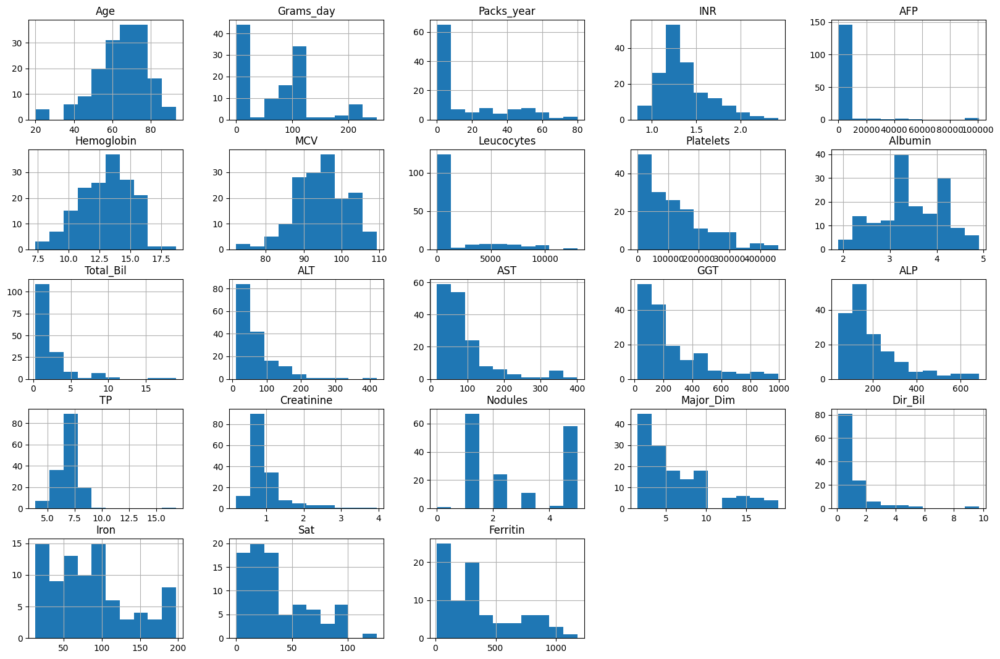

In [889]:
hcc_data.hist(figsize=(20,13))

In [890]:
hcc_data.replace('?', np.nan, inplace=True)

In [891]:
mask = ((hcc_data['Class'] == 'Lives') | (hcc_data['Class'] == 'Dies'))
hcc_data.loc[mask,'Encephalopathy'] = hcc_data.loc[mask,'Encephalopathy'].fillna('Not Applicable')
hcc_data.loc[mask,'Ascites'] = hcc_data.loc[mask,'Ascites'].fillna('Not Applicable')

In [892]:
hcc_data.isna().sum()

Gender             0
Symptoms          18
Alcohol            0
HBsAg             17
HBeAg             39
HBcAb             24
HCVAb              9
Cirrhosis          0
Endemic           39
Smoking           41
Diabetes           3
Obesity           10
Hemochro          23
AHT                3
CRI                2
HIV               14
NASH              22
Varices           52
Spleno            15
PHT               11
PVT                3
Metastasis         4
Hallmark           2
Age                0
Grams_day         48
Packs_year        53
PS                 0
Encephalopathy     0
Ascites            0
INR                4
AFP                8
Hemoglobin         3
MCV                3
Leucocytes         3
Platelets          3
 Albumin           6
Total_Bil          5
ALT                4
AST                3
GGT                3
ALP                3
TP                11
Creatinine         7
Nodules            2
Major_Dim         20
Dir_Bil           44
Iron              79
Sat          

In [893]:
def impute_missing_data(data):
    for column in data.columns:
        if data[column].dtype == 'object':  # Para dados categóricos
            # Preencher com a moda
            mode_value = data[column].mode()[0]
            data[column].fillna(mode_value,inplace=True)
        else:  # Para dados numéricos
            # Preencher com a mediana
            median_value = data[column].median()
            data[column].fillna(median_value,inplace=True)

# Aplicar a função ao dataset
impute_missing_data(hcc_data)


C:\Users\leono\AppData\Local\Temp\ipykernel_15952\992650362.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[column].fillna(mode_value,inplace=True)
C:\Users\leono\AppData\Local\Temp\ipykernel_15952\992650362.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example,

In [894]:
hcc_data.isna().sum()

Gender            0
Symptoms          0
Alcohol           0
HBsAg             0
HBeAg             0
HBcAb             0
HCVAb             0
Cirrhosis         0
Endemic           0
Smoking           0
Diabetes          0
Obesity           0
Hemochro          0
AHT               0
CRI               0
HIV               0
NASH              0
Varices           0
Spleno            0
PHT               0
PVT               0
Metastasis        0
Hallmark          0
Age               0
Grams_day         0
Packs_year        0
PS                0
Encephalopathy    0
Ascites           0
INR               0
AFP               0
Hemoglobin        0
MCV               0
Leucocytes        0
Platelets         0
 Albumin          0
Total_Bil         0
ALT               0
AST               0
GGT               0
ALP               0
TP                0
Creatinine        0
Nodules           0
Major_Dim         0
Dir_Bil           0
Iron              0
Sat               0
Ferritin          0
Class             0


### 4. Machine Learning Algorithms <a id='Machine_Learning_Algorithms'></a>

[Back_to_top](#table_of_contents)

In [1182]:
data_benchmark = hcc_data.copy()

In [1183]:
data_benchmark['Class'].value_counts()

Class
Lives    102
Dies      63
Name: count, dtype: int64

In [1184]:
# Remover espaços extras
data_benchmark['Class'] = data_benchmark['Class'].str.strip()

# Padronizar a capitalização
data_benchmark['Class'] = data_benchmark['Class'].str.title() 
# Verificar valores únicos antes do mapeamento
print("Valores únicos antes do mapeamento:", data_benchmark['Class'].unique())


Valores únicos antes do mapeamento: ['Lives' 'Dies']


In [1185]:
# Aplicar o mapeamento
data_benchmark['Class'] = data_benchmark['Class'].map({'Dies': 0, 'Lives': 1})

# Verificar valores únicos após o mapeamento
print("Valores únicos após o mapeamento:", data_benchmark['Class'].unique())

Valores únicos após o mapeamento: [1 0]


In [1186]:
data_benchmark['Class'].value_counts()

Class
1    102
0     63
Name: count, dtype: int64

#### 4.1 Train-tes split <a id='Train-test_split'></a>

In [1187]:
from sklearn.model_selection import train_test_split

In [1188]:
X = data_benchmark.drop(['Class'],axis=1)
y = data_benchmark['Class']

In [1189]:
#one-hote encode
X = pd.get_dummies(X)

In [1190]:
#Dividir os dados em conjuntos de treinamento e teste
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)

In [1191]:
#Escalonar os dados
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s = scaler.transform(X_test)

#### 4.2 Fit a model to the data<a id='Fit_a_model_to_the_data'></a>

##### 4.2.1 Random Forest Model

In [1192]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

##### Treinar e testar o modelo sem os dados estarem escalonados:

In [1235]:
forest = RandomForestClassifier()

In [1236]:
forest.fit(X_train,y_train)

RandomForestClassifier()

In [1237]:
forest.score(X_test,y_test)

0.5757575757575758

In [1134]:
y_pred1_1 = forest.predict(X_test)

<Axes: >

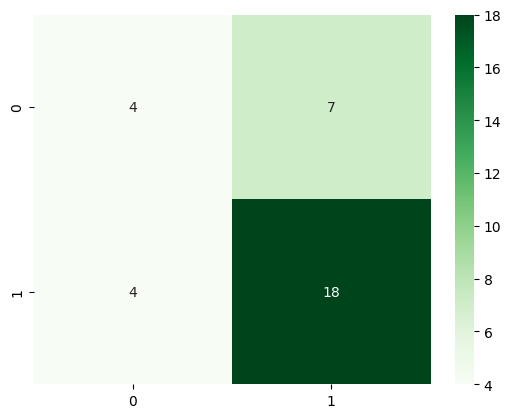

In [1135]:
sns.heatmap(confusion_matrix(y_test,y_pred1_1), annot=True, fmt='d', cmap='Greens')

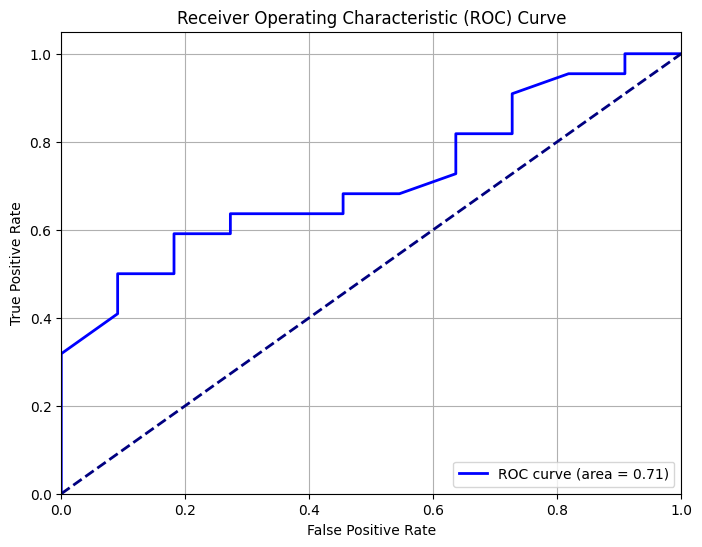

In [1136]:
from sklearn.metrics import roc_curve, roc_auc_score

# Predizer as probabilidades para a classe positiva
y_prob1 = forest.predict_proba(X_test)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [1137]:
print(classification_report(y_test,y_pred1_1))

              precision    recall  f1-score   support

           0       0.50      0.36      0.42        11
           1       0.72      0.82      0.77        22

    accuracy                           0.67        33
   macro avg       0.61      0.59      0.59        33
weighted avg       0.65      0.67      0.65        33



##### Treinar e testar o modelo com os dados escalonados:

In [1146]:
forest2 = RandomForestClassifier()

In [1147]:
forest2.fit(X_train_s,y_train)

RandomForestClassifier()

In [1148]:
forest2.score(X_test_s,y_test)

0.696969696969697

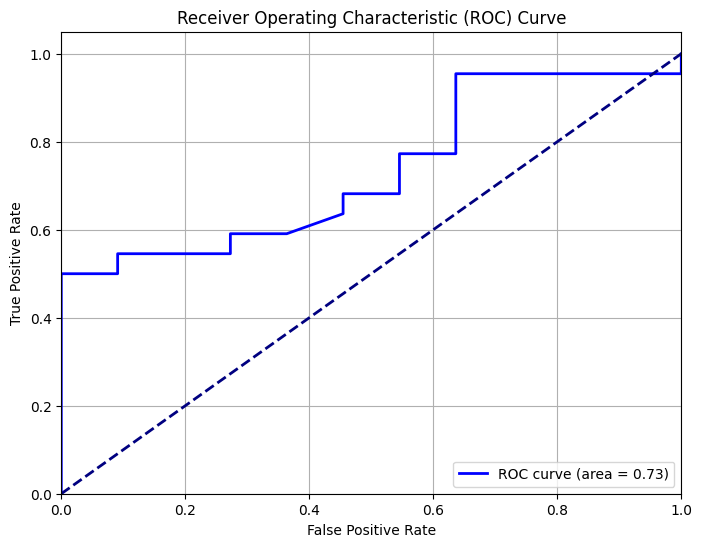

In [1149]:

# Predizer as probabilidades para a classe positiva
y_prob1 = forest2.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

##### Treinar e testar o modelo usando um Hyperparameter Tuning, sem os dados estarem escalonados:

In [1150]:
from sklearn.model_selection import GridSearchCV

In [1163]:
#Definir os parâmetros mais relevantes para aplicar o GridSearchCV no modelo
param_grid = {
    "n_estimators": [30,45,50],
    "max_depth": [8,15,25],
    "min_samples_split": [4,6,8]   
}
#Configurar o GridSearchCV
grid_search = GridSearchCV(forest,param_grid,cv=5,
                           return_train_score = True)
#Ajustar o GridSearchCV aos dados de treinamento
grid_search.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [8, 15, 25],
                         'min_samples_split': [4, 6, 8],
                         'n_estimators': [30, 45, 50]},
             return_train_score=True)

In [1164]:
#Calcular os melhores valores para cada parâmetro
grid_search.best_estimator_

RandomForestClassifier(max_depth=8, min_samples_split=4, n_estimators=50)

In [1166]:
grid_search.score(X_test,y_test)

0.6666666666666666

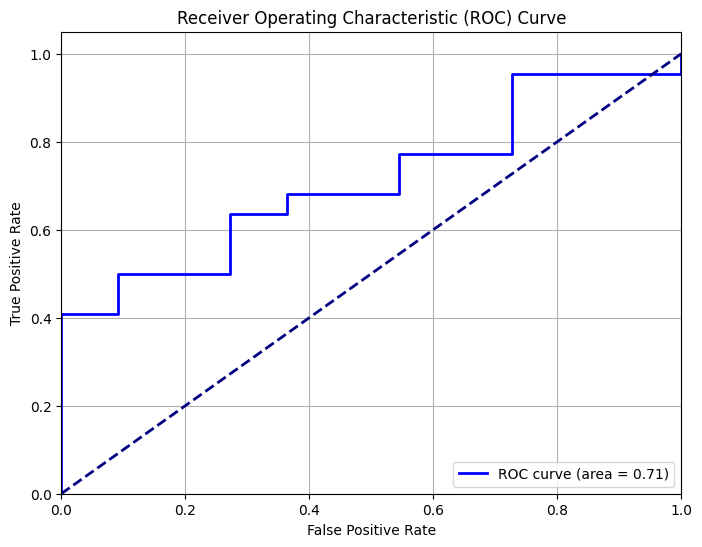

In [1167]:
# Predizer as probabilidades para a classe positiva
y_prob1 = grid_search.predict_proba(X_test)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

##### Treinar e testar o modelo usando um Hyperparameter Tuning, com os dados escalonados:

In [1174]:
#Definir os parâmetros mais relevantes para aplicar o GridSearchCV no modelo
param_grid = {
    "n_estimators": [95,110,130],
    "max_depth": [25,30,40],
    "min_samples_split": [3,4,5]   
}
#Configurar o GridSearchCV
grid_search2 = GridSearchCV(forest2,param_grid,cv=5,
                           return_train_score = True)
#Ajustar o GridSearchCV aos dados de treinamento
grid_search2.fit(X_train_s,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [25, 30, 40],
                         'min_samples_split': [3, 4, 5],
                         'n_estimators': [95, 110, 130]},
             return_train_score=True)

In [1175]:
#Calcular os melhores valores para cada parâmetro
grid_search2.best_estimator_

RandomForestClassifier(max_depth=25, min_samples_split=5, n_estimators=95)

In [1176]:
grid_search2.score(X_test_s,y_test)

0.6363636363636364

In [1177]:
y_pred1 = grid_search2.predict(X_test_s)

In [1178]:
from sklearn.metrics import confusion_matrix

In [1179]:
conf_matrix1 = confusion_matrix(y_test,y_pred1)

<Axes: >

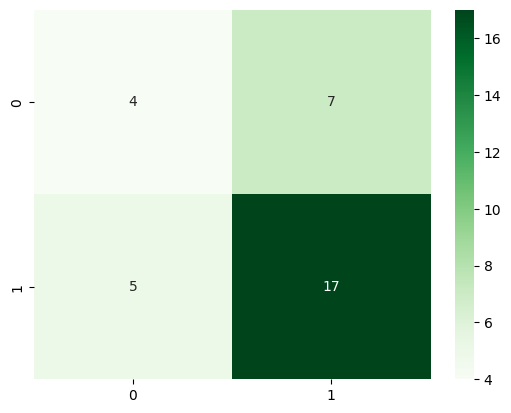

In [1180]:
sns.heatmap(conf_matrix1, annot=True, fmt='d', cmap='Greens')

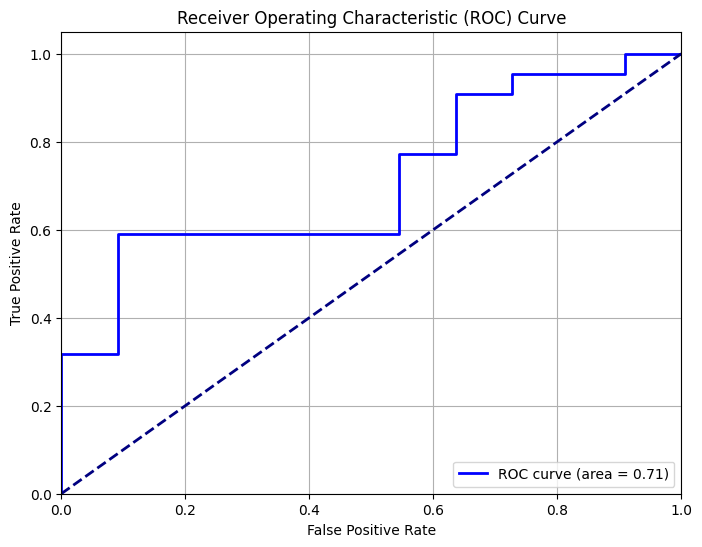

In [1181]:
# Predizer as probabilidades para a classe positiva
y_prob1 = grid_search2.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [930]:
print(classification_report(y_test,y_pred1))

              precision    recall  f1-score   support

           0       1.00      0.50      0.67        14
           1       0.73      1.00      0.84        19

    accuracy                           0.79        33
   macro avg       0.87      0.75      0.76        33
weighted avg       0.84      0.79      0.77        33



#### ->Podemos então concluir que para o modelo Random Forest sem Hyperparameter Tuning e sem os dados estarem escalonados tem o melhor resultado:

In [931]:
#precision: proporção de exemplos positivos classificados corretamente em #relação a todos os exemplos classificados como positivos
#vdd positivos / (vdd positivos + falsos positivos)
#recall: sensibilidade; proporção de exemplos positivos corretamente classificados pelo modelo em relação a todos os exemplos que realmente pertencem à classe positiva
# vdd positivos / (vdd positivos + falsos negativos)
#f1-score: 2* (precision*recall)/(precision + recall)
# média harmonica entre as 2 metricas acima, fornecendo equilibrio
#support: número de ocorrências reais da classe no conjunto de dados de teste
#médias das métricas (precisão, recall, f1-score) calculadas para cada classe.
#A média ponderada (weighted avg) leva em consideração o suporte de cada classe
#A média macro (macro avg) não leva em consideração o desequilíbrio de classe5

##### 4.2.2 Logistic Regression Model

In [932]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

##### Treinar e testar o modelo com os dados escalonados:

In [933]:
log_reg =  LogisticRegression()

In [934]:
log_reg.fit(X_train_s,y_train)

LogisticRegression()

In [935]:
log_reg.score(X_train_s,y_train)

0.9090909090909091

In [936]:
y_pred2_1 = log_reg.predict(X_test_s)

<Axes: >

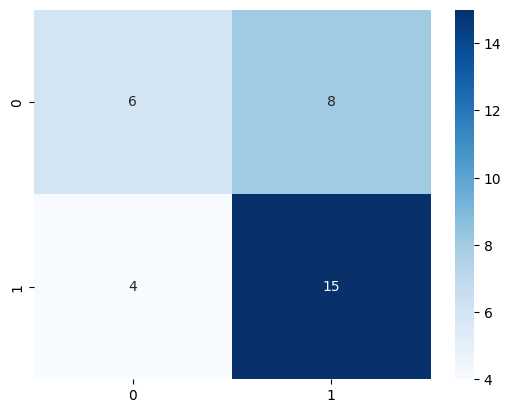

In [937]:
sns.heatmap(confusion_matrix(y_test,y_pred2_1), annot=True, fmt='d', cmap='Blues')

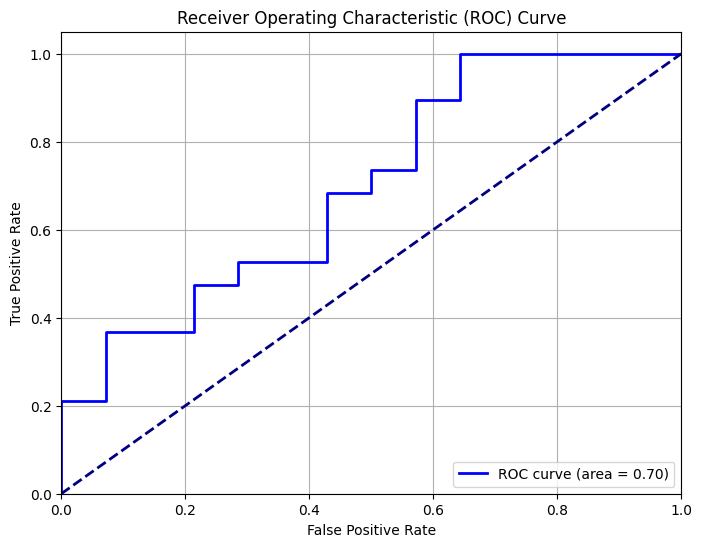

In [938]:
# Predizer as probabilidades para a classe positiva
y_prob1 = log_reg.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [939]:
print(classification_report(y_test,y_pred2_1))

              precision    recall  f1-score   support

           0       0.60      0.43      0.50        14
           1       0.65      0.79      0.71        19

    accuracy                           0.64        33
   macro avg       0.63      0.61      0.61        33
weighted avg       0.63      0.64      0.62        33



##### Treinar e testar o modelo usando um Hyperparameter Tuning, com os dados escalonados:

In [940]:
#Definir os parâmetros mais relevantes para aplicar o GridSearchCV no modelo
param_grid = {
    'penalty' : ['l1','l2','elasticnet'],
    'C': [0.001,0.01,0.1,1,10],
    'solver':['lbfgs','liblinear','saga'],
    'max_iter':[100,1000,2500,5000]
}
#Configurar o GridSearchCV
log_reg_grid = GridSearchCV(log_reg,param_grid,cv = 5)
#Ajustar o GridSearch aos dados de treinamento
log_reg_grid.fit(X_train_s,y_train)

C:\Users\leono\anaconda3\envs\data\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\leono\anaconda3\envs\data\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\leono\anaconda3\envs\data\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\leono\anaconda3\envs\data\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\leono\anaconda3\envs\data\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\leono\anaconda3\envs\data\Lib\site-packages\sklearn

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10],
                         'max_iter': [100, 1000, 2500, 5000],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['lbfgs', 'liblinear', 'saga']})

In [941]:
log_reg_grid.best_estimator_

LogisticRegression(C=1, penalty='l1', solver='liblinear')

In [942]:
log_reg_grid.score(X_test_s,y_test)

0.6666666666666666

In [943]:
y_pred2 = log_reg_grid.predict(X_test_s)

<Axes: >

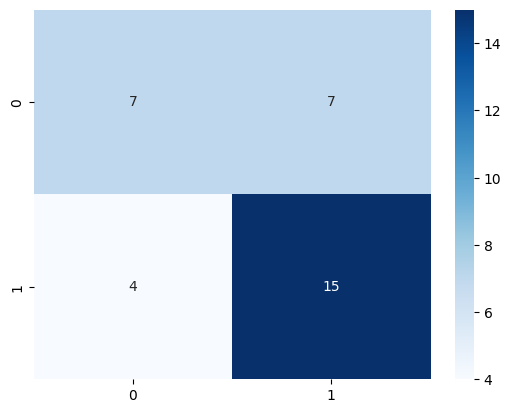

In [944]:
sns.heatmap(confusion_matrix(y_test,y_pred2), annot=True, fmt='d', cmap='Blues')

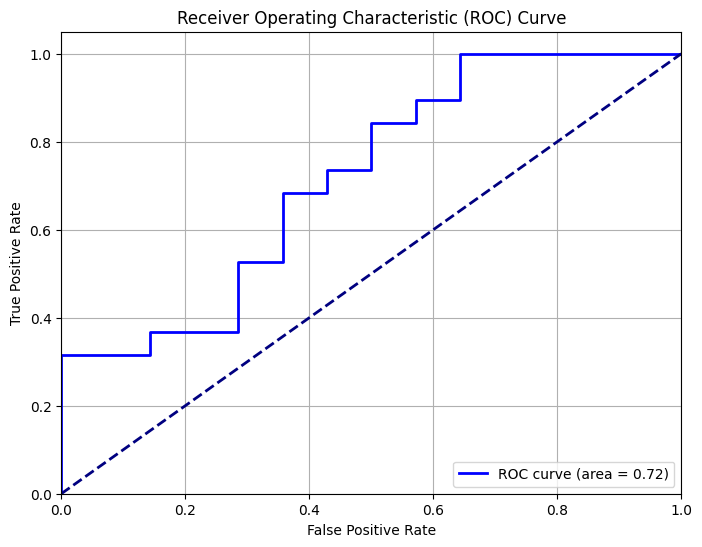

In [945]:
# Predizer as probabilidades para a classe positiva
y_prob1 = log_reg_grid.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [946]:
print(classification_report(y_test,y_pred2))

              precision    recall  f1-score   support

           0       0.64      0.50      0.56        14
           1       0.68      0.79      0.73        19

    accuracy                           0.67        33
   macro avg       0.66      0.64      0.65        33
weighted avg       0.66      0.67      0.66        33



#### -> Podemos concluir que ambos os modelos são bons, sendo que o modelo sem o Hyperparameter Tuning é ligeiramente melhor.

##### 4.2.3 GradientBoosting Classifier Model

In [947]:
from sklearn.ensemble import GradientBoostingClassifier

In [948]:
from sklearn.model_selection import cross_val_score

##### Treinar e testar o modelo sem os dados escalonados:

In [949]:
gbr = GradientBoostingClassifier()

In [950]:
gbr.fit(X_train,y_train)

GradientBoostingClassifier()

In [951]:
gbr.score(X_test,y_test)

0.7272727272727273

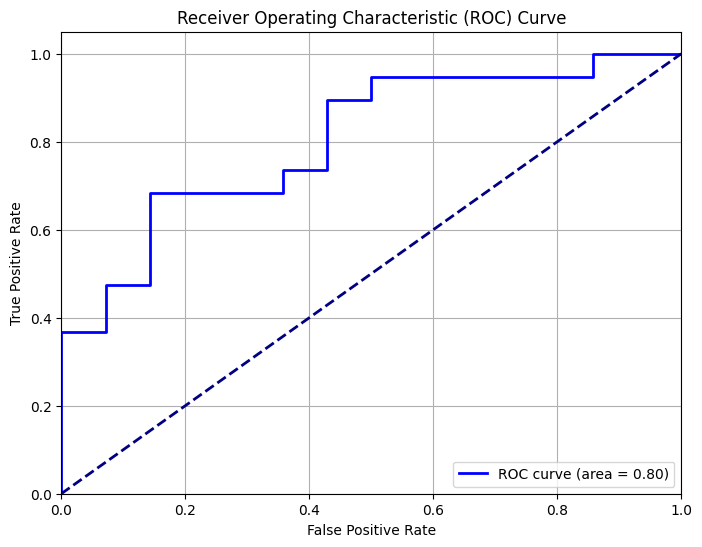

In [952]:
# Predizer as probabilidades para a classe positiva
y_prob1 = gbr.predict_proba(X_test)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

##### Treinar e testar o modelo com os dados escalonados:

In [953]:
gbr2 = GradientBoostingClassifier()

In [954]:
gbr2.fit(X_train_s,y_train)

GradientBoostingClassifier()

In [955]:
gbr2.score(X_test_s,y_test)

0.7575757575757576

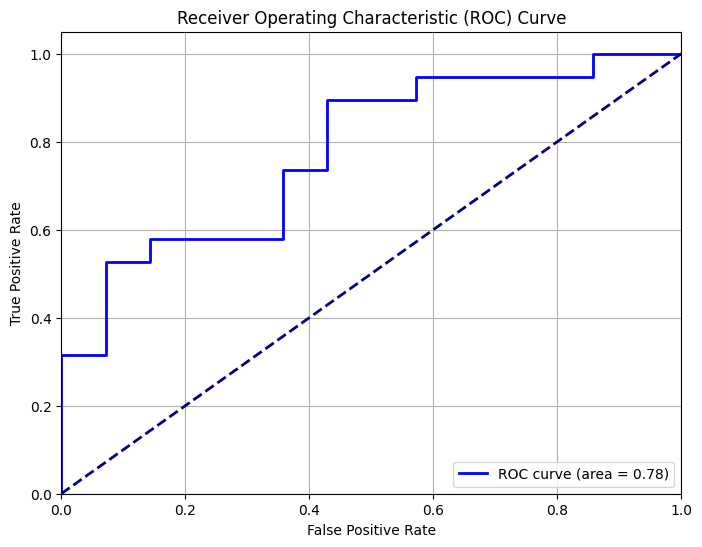

In [956]:
# Predizer as probabilidades para a classe positiva
y_prob1 = gbr2.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

##### Avaliar o modelo,com dados escalonados, usando cross-validation:

In [957]:
cross_val_score(gbr2,X_train_s,y_train,cv=5).mean()

0.6732193732193732

##### Treinar e testar o modelo usando um Hyperparameter Tuning, sem os dados escalonados:

In [958]:
#Definir os parâmetros mais relevantes para aplicar o GridSearchCV no modelo
param_grid = {
    'n_estimators' : [10,50,100,500],
    'learning_rate': [0.0001,0.001,0.01,0.1,1.0],
    'max_depth':[3,5,7,9]  
}
#Configurar o GridSearchCV
gbr3 = GridSearchCV(gbr,param_grid,cv = 5)
#Ajustar ao GridSearchCV aos dados de treinamento
gbr3.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1.0],
                         'max_depth': [3, 5, 7, 9],
                         'n_estimators': [10, 50, 100, 500]})

In [959]:
gbr3.best_params_

{'learning_rate': 1.0, 'max_depth': 3, 'n_estimators': 10}

In [960]:
gbr3.score(X_test,y_test)

0.696969696969697

In [961]:
y_pred3 = gbr3.predict(X_test)

In [962]:
conf_matrix3 = confusion_matrix(y_test,y_pred3)

In [963]:
print(classification_report(y_test,y_pred3))

              precision    recall  f1-score   support

           0       0.64      0.64      0.64        14
           1       0.74      0.74      0.74        19

    accuracy                           0.70        33
   macro avg       0.69      0.69      0.69        33
weighted avg       0.70      0.70      0.70        33



<Axes: >

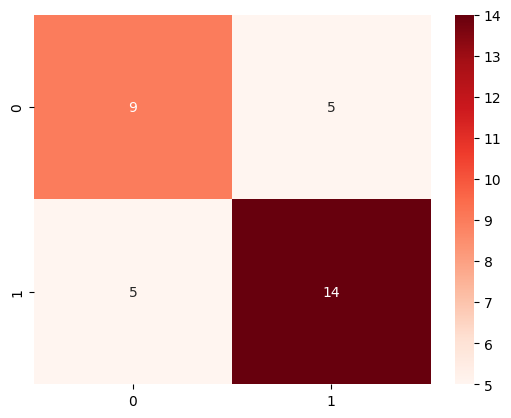

In [964]:
sns.heatmap(conf_matrix3, annot=True, fmt='d', cmap='Reds')

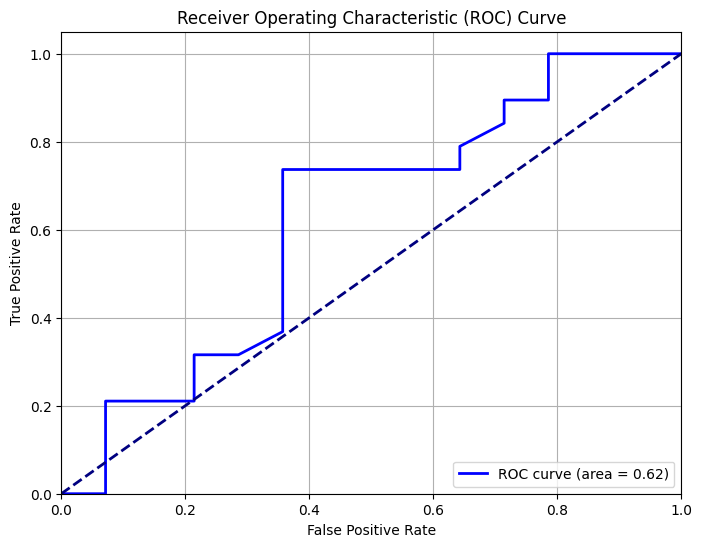

In [965]:
# Predizer as probabilidades para a classe positiva
y_prob1 = gbr3.predict_proba(X_test)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

##### Treinar e testar o modelo usando um Hyperparameter Tuning, com os dados escalonados:

In [966]:
#Definir os parâmetros mais relevantes para aplicar o GridSearchCV no modelo
param_grid = {
    'n_estimators' : [10,50,100,500],
    'learning_rate': [0.0001,0.001,0.01,0.1,1.0],
    'max_depth':[3,5,7,9]  
}
#Configurar o GridSearchCV
gbr4 = GridSearchCV(gbr2,param_grid,cv = 3)
#Ajustar o GridSearchCV aos dados de treino
gbr4.fit(X_train_s,y_train)

GridSearchCV(cv=3, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.0001, 0.001, 0.01, 0.1, 1.0],
                         'max_depth': [3, 5, 7, 9],
                         'n_estimators': [10, 50, 100, 500]})

In [967]:
gbr4.score(X_test_s,y_test)

0.696969696969697

In [968]:
y_pred3_1= gbr4.predict(X_test_s)

<Axes: >

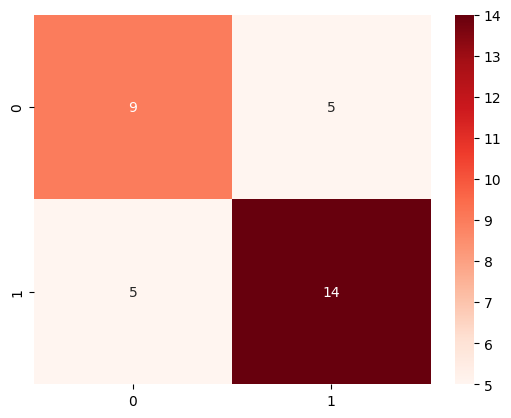

In [969]:
sns.heatmap(confusion_matrix(y_test,y_pred3_1), annot=True, fmt='d', cmap='Reds')

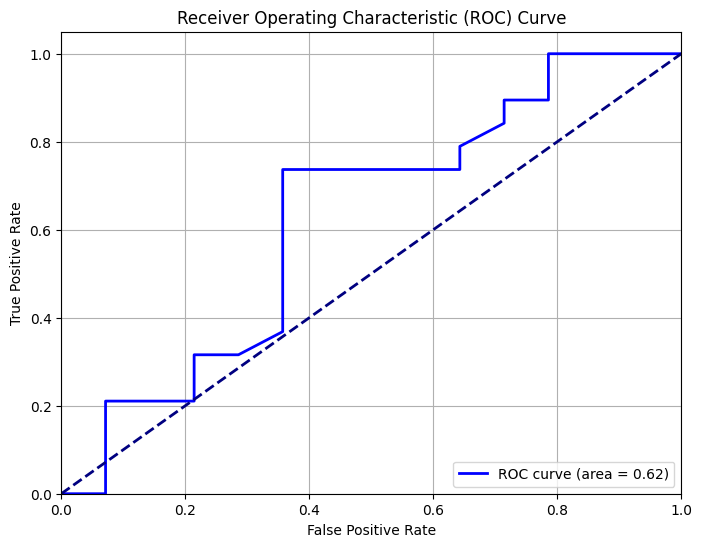

In [970]:
# Predizer as probabilidades para a classe positiva
y_prob1 = gbr4.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [971]:
print(classification_report(y_test,y_pred3_1))

              precision    recall  f1-score   support

           0       0.64      0.64      0.64        14
           1       0.74      0.74      0.74        19

    accuracy                           0.70        33
   macro avg       0.69      0.69      0.69        33
weighted avg       0.70      0.70      0.70        33



#### ->Podemos verificar que deu igual resultado para ambos os modelos e que ambos têm uma boa performance.

##### 4.2.4 SVC Model

In [972]:
from sklearn.svm import SVC

##### Treinar e testar o modelo com os dados escalonados:

In [973]:
svc = SVC(probability=True)

In [974]:
svc.fit(X_train_s,y_train)

SVC(probability=True)

In [975]:
svc.score(X_test_s,y_test)

0.7878787878787878

In [976]:
y_pred4_1 = svc.predict(X_test_s)

<Axes: >

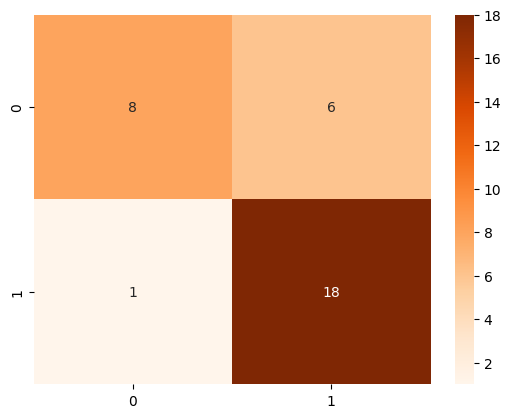

In [977]:
sns.heatmap(confusion_matrix(y_test,y_pred4_1), annot=True, fmt='d', cmap='Oranges')

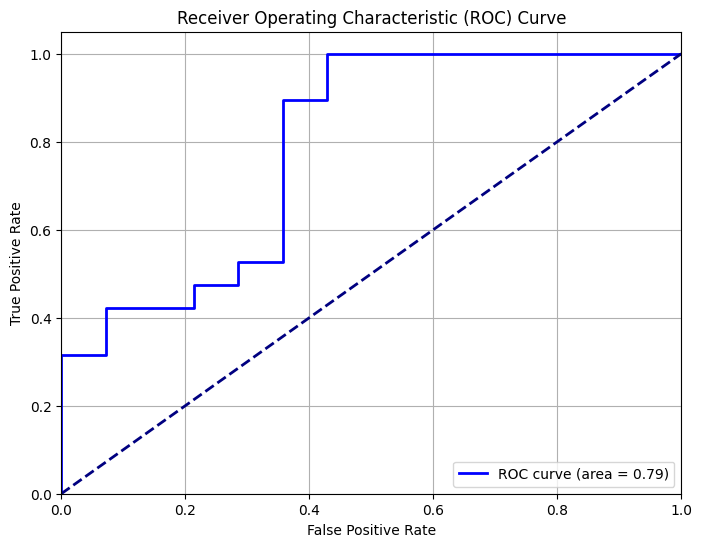

In [978]:
# Predizer as probabilidades para a classe positiva
y_prob1 = svc.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [979]:
print(classification_report(y_test,y_pred4_1))

              precision    recall  f1-score   support

           0       0.89      0.57      0.70        14
           1       0.75      0.95      0.84        19

    accuracy                           0.79        33
   macro avg       0.82      0.76      0.77        33
weighted avg       0.81      0.79      0.78        33



##### Treinar e testar o modelo usando um Hyperparameter Tuning, com os dados escalonados:

In [980]:
#Definir os parâmetros mais relevantes para aplicar o GridSearchCV no modelo
param_grid = {
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': ['scale', 'auto'],
}
#Configurar o GridSearchCV
svc2 = GridSearchCV(svc,param_grid,cv = 3)
#Ajustar o GridSearchCV aos dados de treino
svc2.fit(X_train_s,y_train)

GridSearchCV(cv=3, estimator=SVC(probability=True),
             param_grid={'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'poly']})

In [981]:
svc2.best_params_

{'gamma': 'scale', 'kernel': 'linear'}

In [982]:
svc2.score(X_test_s,y_test)

0.6666666666666666

In [983]:
conf_matrix4 = confusion_matrix(y_test,y_pred4)

<Axes: >

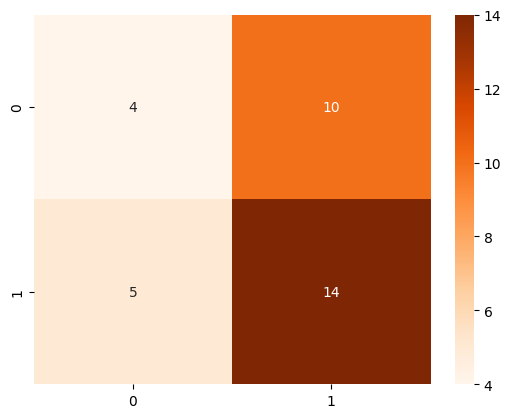

In [984]:
sns.heatmap(conf_matrix4, annot=True, fmt='d', cmap='Oranges')

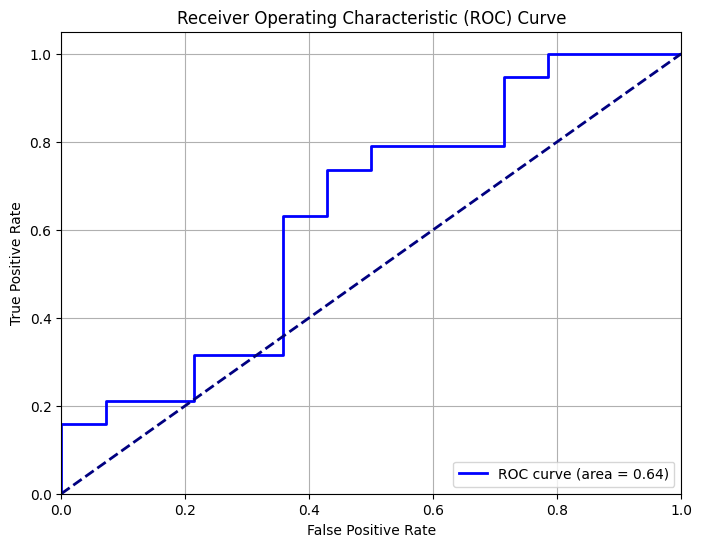

In [985]:
# Predizer as probabilidades para a classe positiva
y_prob1 = svc2.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [986]:
print(classification_report(y_test,y_pred4))

              precision    recall  f1-score   support

           0       0.44      0.29      0.35        14
           1       0.58      0.74      0.65        19

    accuracy                           0.55        33
   macro avg       0.51      0.51      0.50        33
weighted avg       0.52      0.55      0.52        33



#### ->Podemos verificar que deu o mesmo resultado em ambos os modelos.

##### 4.2.5 KNN

In [987]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

##### Treinar e testar o modelo com os dados escalonados:

In [988]:
knn = KNeighborsClassifier()
knn.fit(X_train_s,y_train)

KNeighborsClassifier()

In [989]:
knn.score(X_test_s,y_test)

0.6363636363636364

In [990]:
y_pred5 = knn.predict(X_test_s)

In [991]:
conf_matrix5 = confusion_matrix(y_test,y_pred5)

<Axes: >

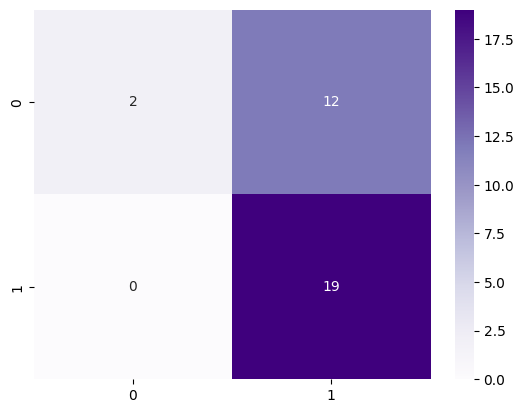

In [992]:
sns.heatmap(conf_matrix5, annot=True, fmt='d', cmap='Purples')

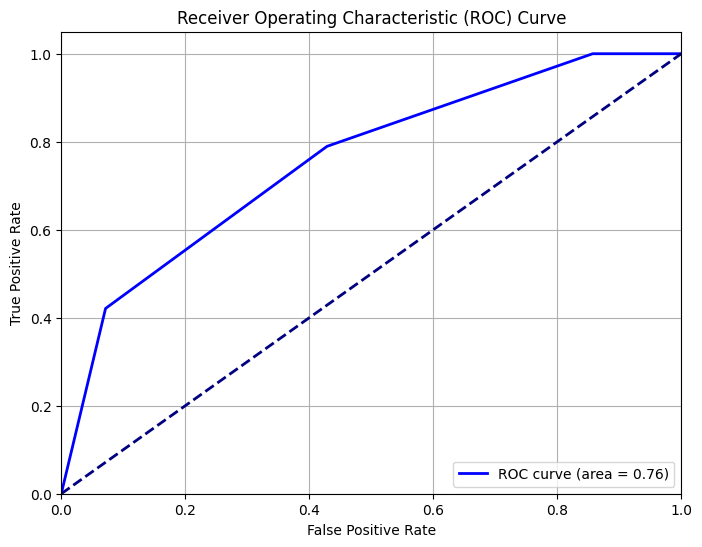

In [993]:
# Predizer as probabilidades para a classe positiva
y_prob1 = knn.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [994]:
print(classification_report(y_test,y_pred5))

              precision    recall  f1-score   support

           0       1.00      0.14      0.25        14
           1       0.61      1.00      0.76        19

    accuracy                           0.64        33
   macro avg       0.81      0.57      0.51        33
weighted avg       0.78      0.64      0.54        33



##### >Podemos verificar que este modelo tem uma baixa performance na deteção da classe "0" (Dies):
    *O recall indica que muitas instâncias reais desta classe não estão a ser detetadas.
   
    *A precisão de 0.67 sugere que quando o modelo prevê "0",ele está correto 67% das vezes.No entanto,a baixa quantidade de previsões corretas reflete-se no baixo F1-score, de 0.31.

##### >O cenário melhora significativamente para a classe "1"(Lives):
    *O recall de 0.96 indica que quase todas as instâncias reais da classe "1" estão a ser corretamente detetadas.

    *A precisão de 0.73 sugere que quando o modelo prevê "1", ele está correto 73% das vezes.O F1-score de 0.83 indica um bom equilíbrio entre precisão e recall.

##### Treinar e testar o modelo usando um Hyperparameter Tuning, com os dados escalonados:

Para oferecer uma estimativa mais confiável utilizamos o RepeatedStratifiedKFold, para reduzir a variabilidade e melhorar a generalização

In [995]:
from sklearn.model_selection import RepeatedStratifiedKFold
#Definir os melhores parâmetros para aplicar o GridSearchCV no modelo
knn_params = {
    "n_neighbors" : range(1,30,2), #número de vizinhos
    "weights" : ["uniform","distance"], #função de ponderação
    "metric" : ["euclidean","manhattan","minkowski"], #métrica de distância
    "leaf_size" : range(1,50,5) #tamanho da folha
}
#Configuração do modelo KNN
knn2 = KNeighborsClassifier()

#Configuração da Cross-Validation: estratificada repetida,com 10 folds e 3 repetições
cv = RepeatedStratifiedKFold(n_splits=10,n_repeats=3,random_state=42)

#GridSearchCV com Cross-Validation
grid_search_knn = GridSearchCV(estimator=knn2,param_grid=knn_params,cv=cv,scoring="accuracy",error_score=0)
grid_results = grid_search_knn.fit(X_train_s,y_train)

#Treinamento do melhor modelo
final_model = knn2.set_params(**grid_results.best_params_)
final_model.fit(X_train_s,y_train)
y_pred6 = final_model.predict(X_test_s)

#Previsões e Avaliações
print(classification_report(y_test,y_pred6))
print(confusion_matrix(y_test,y_pred6))
print(grid_results.best_params_)

              precision    recall  f1-score   support

           0       1.00      0.14      0.25        14
           1       0.61      1.00      0.76        19

    accuracy                           0.64        33
   macro avg       0.81      0.57      0.51        33
weighted avg       0.78      0.64      0.54        33

[[ 2 12]
 [ 0 19]]
{'leaf_size': 1, 'metric': 'euclidean', 'n_neighbors': 5, 'weights': 'uniform'}


<Axes: >

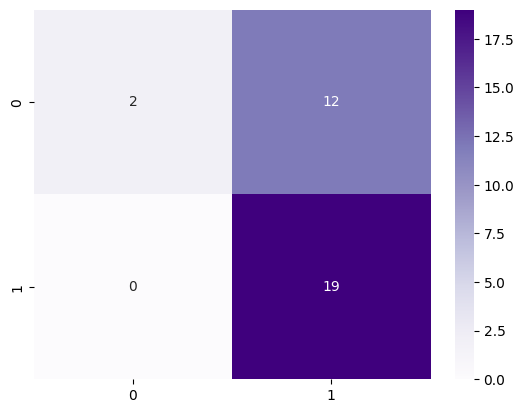

In [996]:
sns.heatmap(confusion_matrix(y_test,y_pred6), annot=True, fmt='d', cmap='Purples')

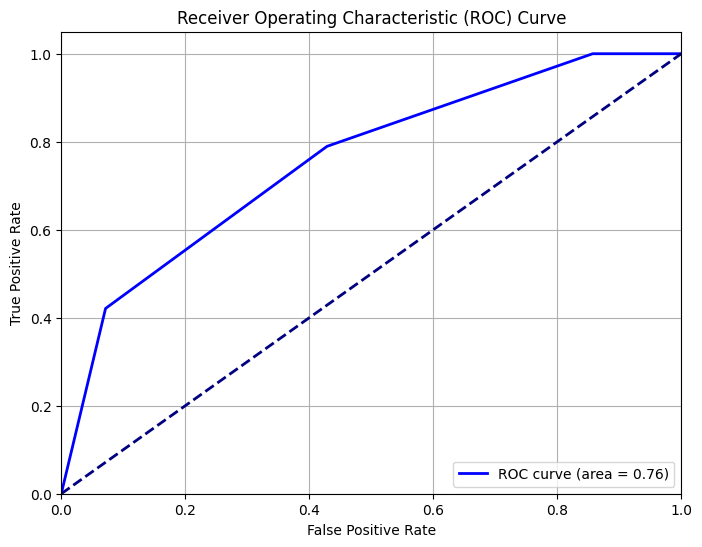

In [997]:
# Predizer as probabilidades para a classe positiva
y_prob1 = knn2.predict_proba(X_test_s)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test, y_prob1)
roc_auc1 = roc_auc_score(y_test, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

#### ->Podemos verificar que o semelhante se repete neste último modelo.Sendo no entanto,ligeiramente melhor que o modelo sem o Hyperparameter Tuning

##### 4.2.6 Decision Tree 

In [998]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

##### Preparar os dados:

In [999]:
X_tree = hcc_data.drop('Class', axis=1)
y_tree = hcc_data['Class']

In [1000]:
label_encoder = LabelEncoder()
y_tree = label_encoder.fit_transform(y_tree)

In [1001]:
X_tree = pd.get_dummies(X_tree, drop_first=True)

In [1002]:
X_train_tree, X_test_tree, y_train_tree, y_test_tree = train_test_split(X_tree, y_tree, test_size=0.3, random_state=42)

##### Treinar e testar o modelo:

In [1003]:
clf = DecisionTreeClassifier(max_depth=50)

In [1004]:
clf.fit(X_train_tree, y_train_tree)

DecisionTreeClassifier(max_depth=50)

In [1005]:
y_pred_tree = clf.predict(X_test_tree)

In [1006]:
accuracy = accuracy_score(y_test_tree, y_pred_tree)
print(f'Acurácia: {accuracy}')

Acurácia: 0.62


<Axes: >

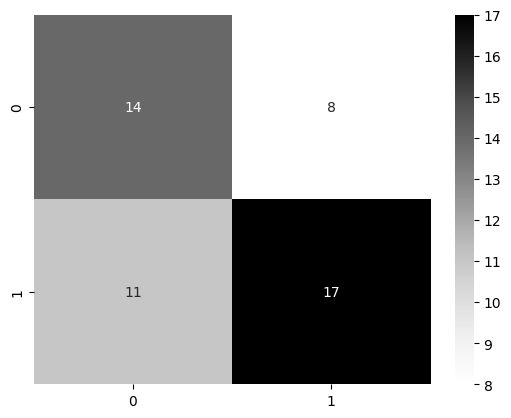

In [1007]:
sns.heatmap(confusion_matrix(y_test_tree,y_pred_tree), annot=True, fmt='d', cmap='Grays')

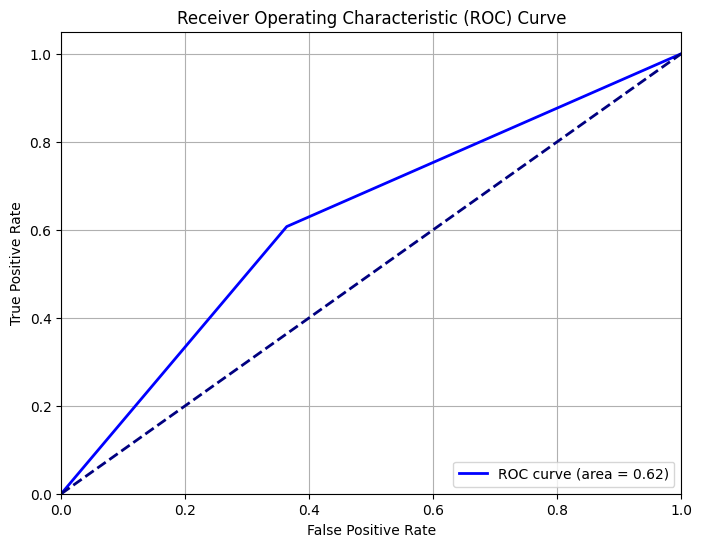

In [1008]:
# Predizer as probabilidades para a classe positiva
y_prob1 = clf.predict_proba(X_test_tree)[:, 1]
# Calcular a curva ROC
fpr1, tpr1, _ = roc_curve(y_test_tree, y_prob1)
roc_auc1 = roc_auc_score(y_test_tree, y_prob1)

# Plotar a curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, color='blue', lw=2, label=f'ROC curve (area = {roc_auc1:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [1009]:
print(classification_report(y_test_tree,y_pred_tree))

              precision    recall  f1-score   support

           0       0.56      0.64      0.60        22
           1       0.68      0.61      0.64        28

    accuracy                           0.62        50
   macro avg       0.62      0.62      0.62        50
weighted avg       0.63      0.62      0.62        50



##### Visualizar a Decision Tree:

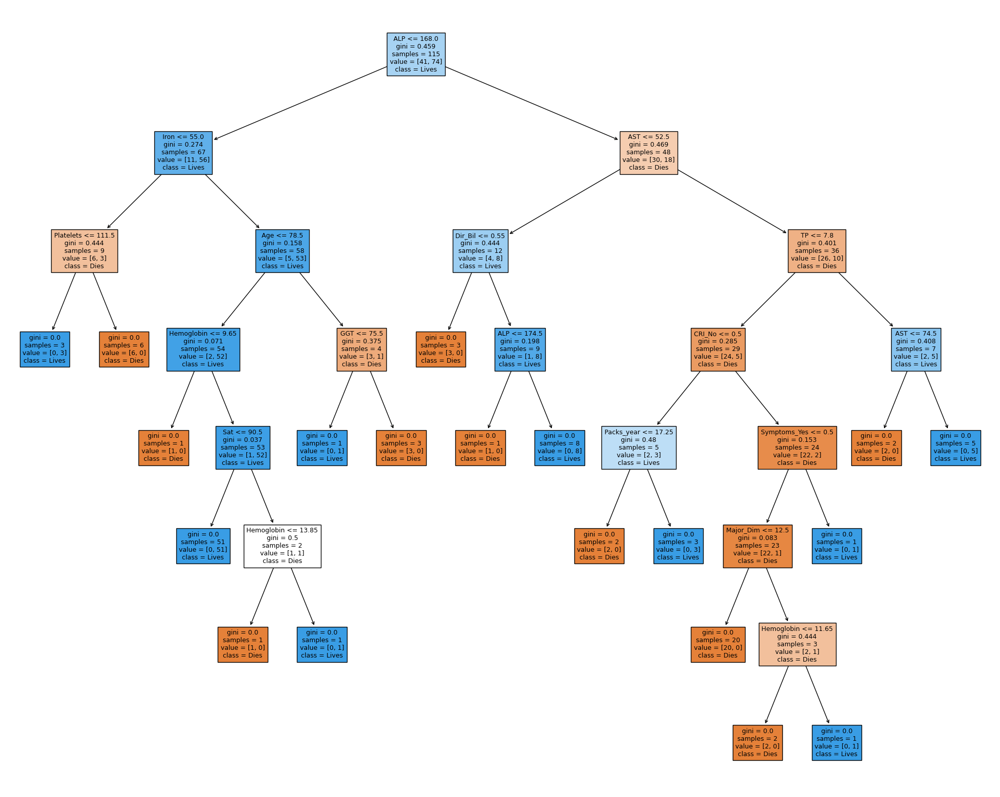

In [1010]:
from sklearn import tree
from matplotlib import pyplot as plt

# Plotar a árvore de decisão
plt.figure(figsize=(25, 20))
_ = tree.plot_tree(clf,
                   feature_names = X.columns.tolist(),
                   class_names={0: 'Dies', 1: 'Lives'},
                   filled=True,
                   fontsize=9)
plt.show()

##### Treinar e testar o modelo com um Hyperparameter Tuning:

In [1011]:
from sklearn.model_selection import StratifiedKFold
param_grid = {
    'max_depth': [1,2,3,4,5],
    'max_features': [1,2,3,4],
    'splitter': ['best','random'],
    'criterion':['gini','entropy']
}
cross_validation_tree = StratifiedKFold(n_splits=10)
grid_search_tree = GridSearchCV(DecisionTreeClassifier(),param_grid, cv=5)
grid_search_tree.fit(X_train_tree, y_train_tree)
y_pred_tree2 = grid_search_tree.predict(X_test_tree)

grid_search_tree = GridSearchCV(tree,
                           param_grid=param_grid,
                           cv=cross_validation_tree)


accuracy = accuracy_score(y_test_tree,y_pred_tree2)
print("Accuracy on test set: {:.2f}".format(accuracy))
print(classification_report(y_test_tree,y_pred_tree2))

Accuracy on test set: 0.56
              precision    recall  f1-score   support

           0       0.50      0.18      0.27        22
           1       0.57      0.86      0.69        28

    accuracy                           0.56        50
   macro avg       0.54      0.52      0.48        50
weighted avg       0.54      0.56      0.50        50



#### ->Podemos concluir que temos melhores resultados para o modelo sem Hyperparameter Tuning.

### 5. Feature engineering <a id='Feature_engineering'></a>

[Back_to_top](#table_of_contents)

##### Para ser mais fácil perceceber não só a correlação das variáveis com o target, mas também a correlação das variáveis entre si, recorremos ao heatmap:

In [1012]:
train_data1 = X.join(y)

<Axes: >

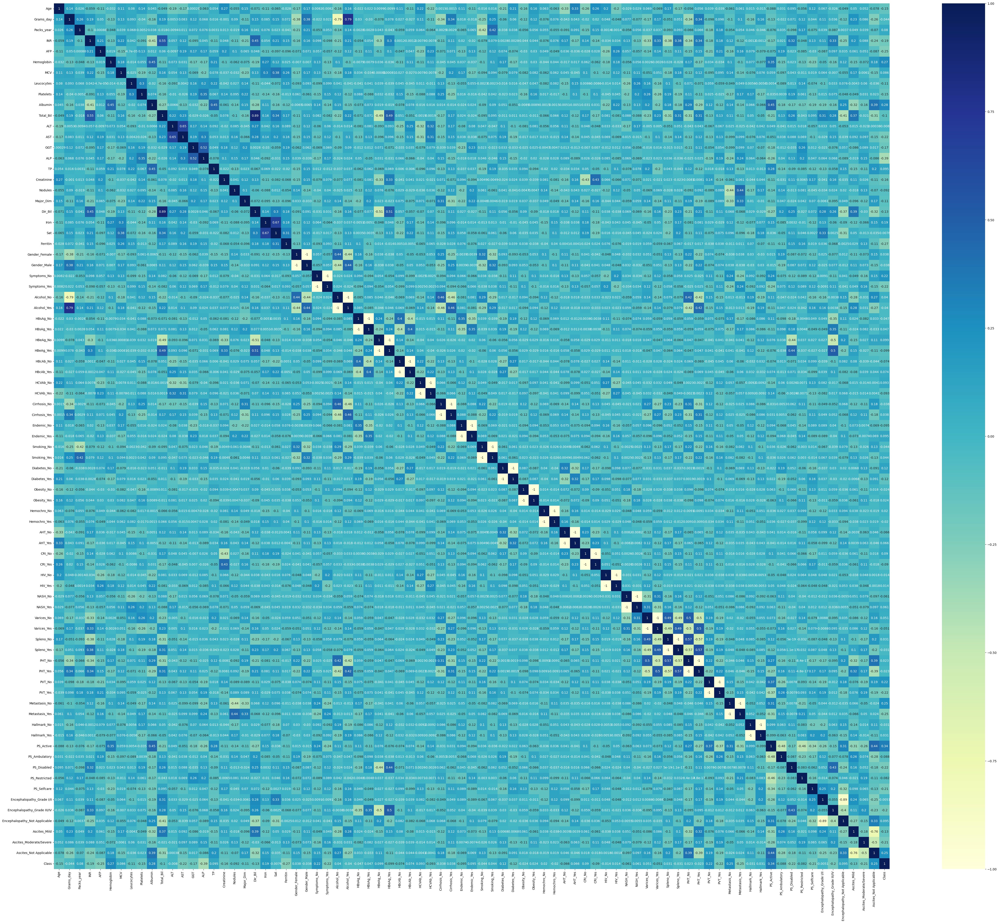

In [1013]:
plt.figure(figsize=(60,50))
sns.heatmap(train_data1.corr(),annot=True,cmap="YlGnBu")

-> Através deste heatmap, verificamos que existem uma grande correlação entre determinadas variáveis, por isso , decidimos acrescentar novas features que correspondem:  

In [1014]:
data_models2 = train_data1.copy()

In [1015]:
# Criação das novas features : razão entre ALT + AST e Dir_Bil + Total_Bil 
data_models2['ALT_AST_Ratio'] = data_models2['ALT'] / data_models2['AST']
data_models2['Dir_Total_Bil_Ratio'] = data_models2['Dir_Bil'] / data_models2['Total_Bil']

In [1016]:
X1 = data_models2.drop(['Class'],axis=True)

In [1017]:
X1_train,y_train,X1_test,y_test = train_test_split(X1,y,test_size=0.2)

In [1018]:
# Padronizar os dados
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
X1_train_s = scaler.fit_transform(X1_train)
X1_test_s = scaler.transform(X1_test)

C:\Users\leono\anaconda3\envs\data\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


ValueError: Expected a 2-dimensional container but got <class 'pandas.core.series.Series'> instead. Pass a DataFrame containing a single row (i.e. single sample) or a single column (i.e. single feature) instead.

In [1021]:
train_data2 = X1.join(y1)

In [1022]:
train_data2

,Age,Grams_day,Packs_year,INR,AFP,Hemoglobin,MCV,Leucocytes,Platelets,Albumin,Total_Bil,ALT,AST,GGT,ALP,TP,Creatinine,Nodules,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Gender_Female,Gender_Male,Symptoms_No,Symptoms_Yes,Alcohol_No,Alcohol_Yes,HBsAg_No,HBsAg_Yes,HBeAg_No,HBeAg_Yes,HBcAb_No,HBcAb_Yes,HCVAb_No,HCVAb_Yes,Cirrhosis_No,Cirrhosis_Yes,Endemic_No,Endemic_Yes,Smoking_No,Smoking_Yes,Diabetes_No,Diabetes_Yes,Obesity_No,Obesity_Yes,Hemochro_No,Hemochro_Yes,AHT_No,AHT_Yes,CRI_No,CRI_Yes,HIV_No,HIV_Yes,NASH_No,NASH_Yes,Varices_No,Varices_Yes,Spleno_No,Spleno_Yes,PHT_No,PHT_Yes,PVT_No,PVT_Yes,Metastasis_No,Metastasis_Yes,Hallmark_No,Hallmark_Yes,PS_Active,PS_Ambulatory,PS_Disabled,PS_Restricted,PS_Selfcare,Encephalopathy_Grade I/II,Encephalopathy_Grade III/IV,Encephalopathy_Not Applicable,Ascites_Mild,Ascites_Moderate/Severe,Ascites_Not Applicable,ALT_AST_Ratio,Dir_Total_Bil_Ratio,Class
0,67,137.0,15.0,1.530,95.0,13.7,106.60,4.9,99.0,3.4,2.1,34.0,41.0,183.0,150.0,7.1,0.70,1.0,3.5,0.5,83.0,27.0,279.0,False,True,True,False,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,True,False,True,True,False,False,True,True,False,True,False,True,False,True,False,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,False,False,False,False,True,False,False,True,0.829268,0.238095,1
1,62,0.0,0.0,1.285,30.5,13.1,94.75,7.2,93000.0,3.4,1.3,50.0,70.0,178.0,159.5,7.0,0.83,1.0,1.8,0.7,83.0,27.0,279.0,True,False,False,True,True,False,True,False,True,False,True,False,False,True,False,True,True,False,False,True,False,True,True,False,True,False,False,True,True,False,True,False,True,False,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,False,False,False,False,True,False,False,True,0.714286,0.538462,1
2,78,50.0,50.0,0.960,5.8,8.9,79.80,8.4,472.0,3.3,0.4,58.0,68.0,202.0,109.0,7.0,2.10,5.0,13.0,0.1,28.0,6.0,16.0,False,True,True,False,False,True,False,True,True,False,False,True,True,False,False,True,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,True,False,True,False,True,False,False,False,False,False,True,True,False,False,0.852941,0.250000,1
3,77,40.0,30.0,0.950,2440.0,13.4,97.10,9.0,279.0,3.7,0.4,16.0,64.0,94.0,174.0,8.1,1.11,2.0,15.7,0.2,83.0,27.0,279.0,False,True,False,True,False,True,True,False,True,False,True,False,True,False,False,True,True,False,False,True,False,True,True,False,True,False,False,True,True,False,True,False,True,False,True,False,True,False,True,False,True,False,False,True,False,True,True,False,False,False,False,False,False,True,False,False,True,0.250000,0.500000,0
4,76,100.0,30.0,0.940,49.0,14.3,95.10,6.4,199.0,4.1,0.7,147.0,306.0,173.0,109.0,6.9,1.80,1.0,9.0,0.7,59.0,15.0,22.0,False,True,False,True,False,True,False,True,True,False,False,True,True,False,False,True,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,True,False,True,False,True,False,True,False,True,False,True,False,False,True,True,False,False,False,False,False,False,True,False,False,True,0.480392,1.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,40,75.0,0.0,0.840,30.5,15.4,109.20,9.3,184000.0,4.6,0.5,35.0,40.0,449.0,109.0,7.6,0.70,5.0,3.0,0.7,83.0,27.0,279.0,True,False,True,False,False,True,True,False,True,False,True,False,False,True,False,True,True,False,False,True,True,False,True,False,True,False,True,False,True,False,False,True,True,False,True,False,True,False,True,False,True,False,True,False,True,False,True,False,False,False,False,False,False,True,False,False,True,0.875000,1.400000,1
161,68,0.0,0.0,1.330,4887.0,12.1,88.90,2.5,141.0,3.0,3.6,50.0,9

<Axes: >

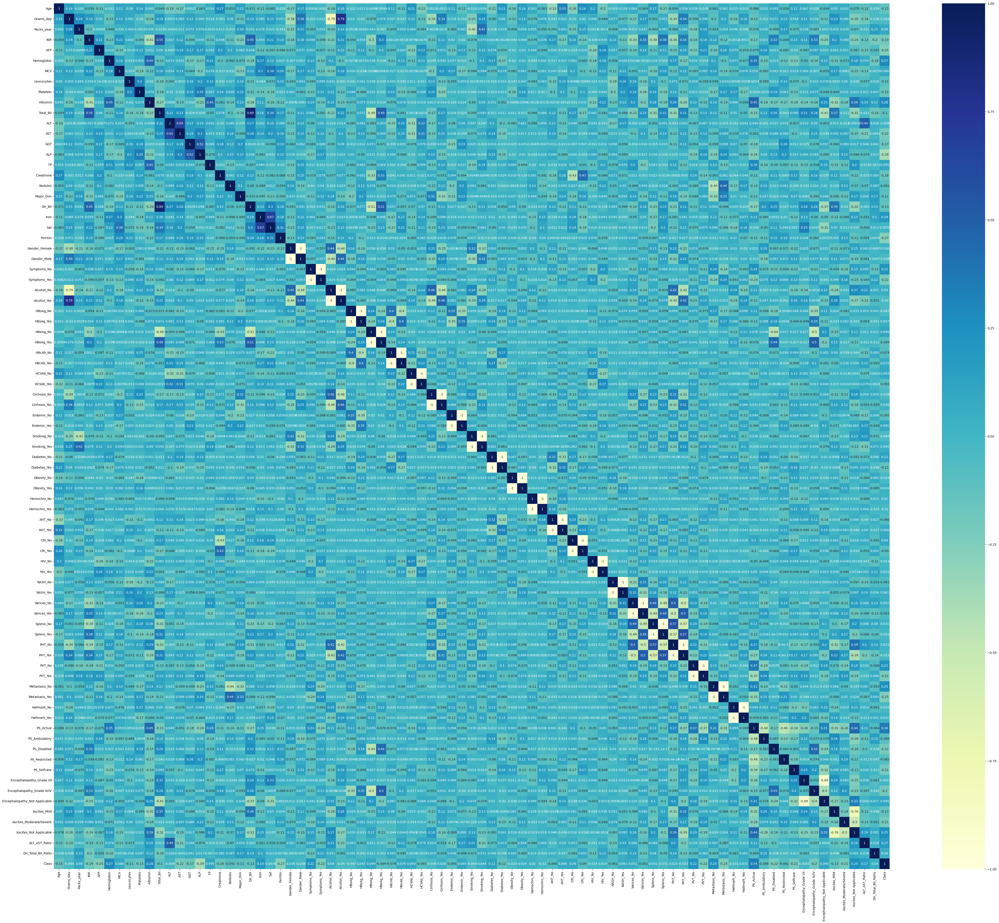

In [1023]:
plt.figure(figsize=(60,50))
sns.heatmap(train_data2.corr(),annot=True,cmap="YlGnBu")

### 6. Model training with new features <a id='Model_training'></a>

[Back_to_top](#table_of_contents)

#####    6.1. Decision tree <a id='Decision_tree'></a>

In [1024]:
from sklearn.feature_selection import RFE

In [1025]:
#Codificar o target Usamos LabelEncoder para codificar a variável alvo Class_Lives em valores numéricos.
le = LabelEncoder() 
y_encoded = le.fit_transform(y)

In [1026]:
# Função para realizar a seleção de características Esta função usa Recursive Feature Elimination (RFE) para selecionar um número específico de características com base em um modelo fornecido.
def select_features(X, y, model, n_features):
    rfe = RFE(estimator=model, n_features_to_select=n_features)
    fit = rfe.fit(X, y)
    return fit

#rfe = RFE(estimator=model, n_features_to_select=n_features): Criamos um objeto RFE (Recursive Feature Elimination) com o estimador model (no nosso caso, um classificador de árvore de decisão) e especificamos o número de características a serem selecionadas (n_features).
#fit = rfe.fit(X, y): Ajustamos o RFE aos dados de entrada X e à variável alvo y, o que efetivamente realiza a seleção das características.
#return fit: Retornamos o objeto RFE ajustado, que contém informações sobre as características selecionadas

In [1027]:
# Função para avaliar o modelo com as características selecionadas Esta função avalia o desempenho do modelo usando validação cruzada com as características selecionadas.
def evaluate_model(X, y, model, selected_features):
    X_selected = X[:, selected_features]
    scores = cross_val_score(model, X_selected, y, cv=5, scoring='accuracy')
    return scores.mean()

In [1028]:
# Modelo base Aqui, definimos o modelo base como um classificador de árvore de decisão
model = DecisionTreeClassifier()

In [1029]:
 # Realizar a seleção de características Este loop itera sobre diferentes números de características, realiza a seleção de características usando RFE e avalia o desempenho do modelo com o número atual de características.
n_features = X.shape[1]  # Número total de características
best_score = 0
best_features = None

In [1030]:
for i in range(1, n_features + 1):
    fit = select_features(X, y_encoded, model, i)
    selected_features = fit.support_
    score = evaluate_model(X.values, y_encoded, model, selected_features)
    print(f"Número de características: {i}, Acurácia: {score}")
    if score > best_score:
        best_score = score
        best_features = selected_features

Número de características: 1, Acurácia: 0.6666666666666666
Número de características: 2, Acurácia: 0.6303030303030303
Número de características: 3, Acurácia: 0.6484848484848484
Número de características: 4, Acurácia: 0.6484848484848484
Número de características: 5, Acurácia: 0.6666666666666666
Número de características: 6, Acurácia: 0.6303030303030303
Número de características: 7, Acurácia: 0.6727272727272726
Número de características: 8, Acurácia: 0.6969696969696969
Número de características: 9, Acurácia: 0.6666666666666666
Número de características: 10, Acurácia: 0.6909090909090908
Número de características: 11, Acurácia: 0.6727272727272726
Número de características: 12, Acurácia: 0.696969696969697
Número de características: 13, Acurácia: 0.6545454545454545
Número de características: 14, Acurácia: 0.6545454545454545
Número de características: 15, Acurácia: 0.6909090909090909
Número de características: 16, Acurácia: 0.6303030303030303
Número de características: 17, Acurácia: 0.6606060

In [1031]:
print("\nMelhor combinação de características:")
selected_feature_names = X.columns[best_features]
print(selected_feature_names)
print(f"Acurácia com a melhor combinação: {best_score}")



Melhor combinação de características:
Index(['Age', 'Packs_year', 'INR', 'Hemoglobin', 'Platelets', 'AST', 'ALP',
       'Major_Dim', 'Dir_Bil', 'Iron', 'Metastasis_No', 'PS_Disabled'],
      dtype='object')
Acurácia com a melhor combinação: 0.696969696969697


##### 6.2 KNN

In [1032]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [1033]:
X_knn = hcc_data.drop('Class', axis=1)
y_knn = hcc_data['Class']

In [1034]:
label_encoder = LabelEncoder()
y_knn = label_encoder.fit_transform(y_knn)

In [1035]:
X_knn = pd.get_dummies(X_knn,drop_first = True)

In [1036]:
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X_knn, y_knn, test_size=0.3, random_state=42)

In [1037]:
knn_v2 = KNeighborsClassifier()

In [1038]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_knn)
X_test_scaled = scaler.transform(X_test_knn)

In [1039]:

knn_v2.fit(X_train_scaled, y_train_knn)

KNeighborsClassifier()

In [1040]:
y_pred_knn_v2 = knn_v2.predict(X_test_scaled)

In [1041]:
model = KNeighborsClassifier()

hcc_data['ALT_AST_Ratio'] = hcc_data['ALT'] / hcc_data['AST']
hcc_data['Dir_Total_Bil_Ratio'] = hcc_data['Dir_Bil'] / hcc_data['Total_Bil']

# Lista para armazenar as pontuações médias de validação cruzada para diferentes conjuntos de características
cv_scores = []
best_score = 0
best_features = None

# Testar diferentes conjuntos de características
for features in range(1, X_train_scaled.shape[1] + 1):
    # Validar usando validação cruzada
    scores = cross_val_score(model, X_train_scaled[:, :features], y_train_knn, cv=5, scoring='accuracy')
    mean_score = np.mean(scores)
    cv_scores.append(mean_score)
    # Verificar se esta é a melhor pontuação até agora
    if mean_score > best_score:
        best_score = mean_score
        best_features = X.columns[:features]

print(f"Melhor conjunto de características: {best_features},\n Acurácia: {best_score}")

Melhor conjunto de características: Index(['Age', 'Grams_day', 'Packs_year', 'INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', ' Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodules', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat'],
      dtype='object'),
 Acurácia: 0.7217391304347827


### 7. Conclusion <a id='Conclusion'></a>
[Back_to_top](#table_of_contents)